In [1]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import os
import shutil
import cython
from ripser import ripser, plot_dgms
from scipy.fftpack import fft,ifft
import wfdb
from scipy import signal
from gwpy.spectrogram import Spectrogram

In [2]:

def theStart(aString):
    print(aString)
    theSamp = wfdb.rdsamp('/home/dr-dunstan/Downloads/training2017/' + aString)
    #fields = wfdb.rdrecord('/home/dr-dunstan/Downloads/training2017/A00061')
    #wfdb.plot_wfdb(record=fields, title='Record A00061 from Physionet Challenge 2017')

    theX = []
    for i in range(0,len(theSamp[0])):
    #print(theSamp[0][i][0])
        theX.append(theSamp[0][i][0])


#print(theX)
    values, ybins, xbins, im = plt.specgram(theX,Fs=300)
    print(xbins)
    #plt.xlabel('Time')

    #plt.ylabel('Frequency')

 

    plt.show()
    theGoodList = stepTwo(values,ybins,xbins,im)
    print("good List")
    print(theGoodList)
    longSegment = getLongestSegment(theGoodList)
    print("longest")
    print(longSegment)
    signalVals = getSignalVals(longSegment,theX,xbins)
    #print("Samp")
    #print(signalVals)
    plotSave(signalVals,aString)
    

In [3]:
def stepTwo(values,ybins,xbins,im):
    #print(theVal)
    theVal = values.transpose() 
    minFreq = 0
    maxFreq = 50
    minFreqIndex = ""
    maxFreqIndex = ""
    theThreshold = .0000001

    countMode = 0

    if (minFreq == 0):
        minFreqIndex = 0
        countMode = 1

    for i in range(len(ybins)-1):
        if(ybins[i] < minFreq and ybins[i+1] > minFreq):
            minFreqIndex = i+1
        if(ybins[i] < maxFreq and ybins[i+1] > maxFreq):
            maxFreqIndex = i

#print(minFreqIndex)
#print(maxFreqIndex)

    theList = []
    theList2 = []
    theGoodList = []
    countMode = 0
    badMode = 0

    for i in range(len(theVal)):
        for j in range(len(theVal[i])):
        #if freq is too low 
            if(j < minFreqIndex):
                if(theVal[i][j] > theThreshold):
                #print("Bad freq exsists (Low) at " + str(i))
                    if(countMode == 0):
                        theList.append(i)
                        countMode += 1
            elif(j > maxFreqIndex):
                if(theVal[i][j] > theThreshold):
                #print("Bad freq exsists (High) at " + str(i)
                    badMode += 1
                    if(countMode == 1):
                        theList2.append(i)
                        countMode += 1
                    
        if(badMode == 0):
            theGoodList.append(i)
        else:
            badMode = 0
    
        countMode = 0
        if(minFreq == 0):
            countMode = 1
    #print(len(theList))
    #print(len(theList2))
    return (theGoodList)

In [4]:
maxLen = 0
first = 0 
last = 0
temp = 0

def getLongestSegment(aList):
    maxLen = 0
    first = 0
    if(len(aList) != 0):
        last = aList[0]
        first = aList[0]
    aTemp = []
    aTemp2 = []
    aTemp3 = []
    maxList = []
    finalList = []
    maxIndex = 0
    for i in range(0,len(aList) -1):
        aTemp.append(aList[i+1] - aList[i])
    
    print(aTemp)
    
    for i in range(len(aTemp)):
        if(aTemp[i] != 1):
            aTemp[i] = "NO"
            
            
    
    for i in range(len(aTemp)):
        if(aTemp[i] != 1):
            aTemp3.append(aTemp2)
            aTemp2 = []
        else:
            aTemp2.append(i+1)
            #finTemp.append
    
    print("the temp 3")
    print(aTemp3)
    
    for element in aTemp3:
        if(maxIndex < len(element)):
            maxList = element
            maxIndex = len(element)
    
    for element in maxList:
        finalList.append(aList[element])
    
    #print(maxList)
    if(len(maxList) != 0):
        finalList.insert(0, aList[maxList[0]] - 1)
        
    
    print(finalList)    
    return(finalList)


def getSignalVals(aList,theSamp,timeList):
    theMin = 0
    theMax = 0
    print("indexList")
    print(aList)
    if(len(aList) != 0):
        theMin = int(timeList[aList[0]]) * 300
        theMax = int(timeList[aList[len(aList)-1]]) *300
        if(theMin == theMax):
            theMax = 300 + theMax
    print("theMin")
    print(theMin)
    print("theMax")
    print(theMax)
    #print(theSamp[theMin:theMax+1])
    return(theSamp[theMin:theMax+1])

#theFinal = getLongestSegment(theGoodList)
#theCleaned = getSignalVals(theFinal)
#print(theCleaned)



In [5]:
#nm#wfdb.wrsamp("A00061_clean",fs=300,sig_name=["ECG"],p_signal=theCleaned,units=["mV"],fmt=['16', '16'])

In [6]:
def plotSave(aList,aString):
    #print(aList)
    x = np.arange(len(aList))
    theCleanedFin = []
    for i in range(0,len(aList)):
        if(len(aList) > 1):
            theCleanedFin.append(aList[i])
        else:
            theCleanedFin.append(aList[i])
        
    y = theCleanedFin

    plt.plot(x,y)
    plt.show()
    z = open(aString +".txt","w")
    for i in range(len(aList)):
        z.write(str(aList[i])+"\n")
    z.close()

A00004
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


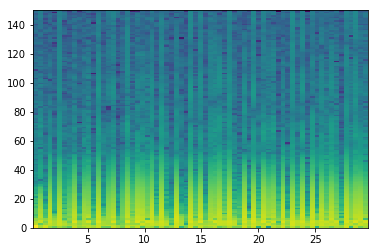

good List
[0, 2, 4, 6, 7, 9, 12, 14, 15, 17, 18, 20, 25, 28, 30, 31, 33, 35, 41, 42, 44, 46, 50, 52, 54, 56, 63, 65]
[2, 2, 2, 1, 2, 3, 2, 1, 2, 1, 2, 5, 3, 2, 1, 2, 2, 6, 1, 2, 2, 4, 2, 2, 2, 7, 2]
the temp 3
[[], [], [], [4], [], [], [8], [10], [], [], [], [15], [], [], [19], [], [], [], [], [], [], []]
[6, 7]
longest
[6, 7]
indexList
[6, 7]
theMin
600
theMax
900


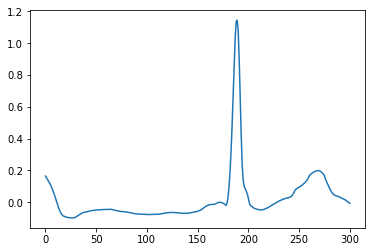

A00005
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

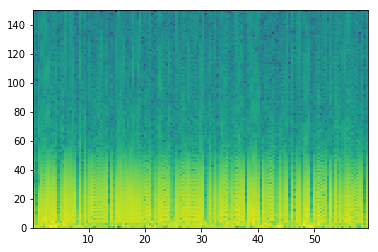

good List
[1, 10, 18, 20, 22, 31, 49, 50, 58, 71, 88, 94, 101, 106, 108, 115, 124, 137]
[9, 8, 2, 2, 9, 18, 1, 8, 13, 17, 6, 7, 5, 2, 7, 9, 13]
the temp 3
[[], [], [], [], [], [], [7], [], [], [], [], [], [], [], [], []]
[49, 50]
longest
[49, 50]
indexList
[49, 50]
theMin
6300
theMax
6600


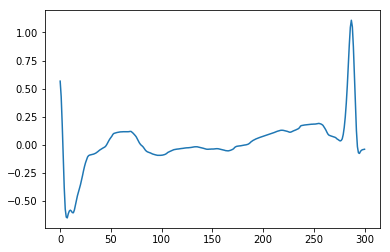

A00009
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


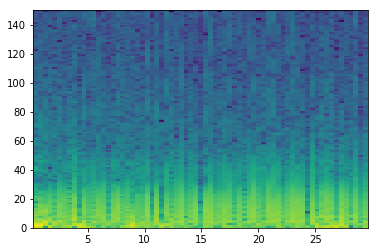

good List
[11, 31, 34, 56]
[20, 3, 22]
the temp 3
[[], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


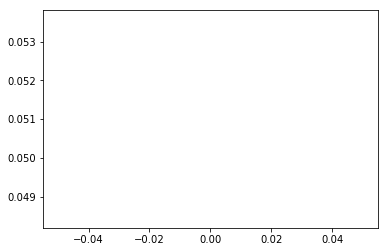

A00015
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667]


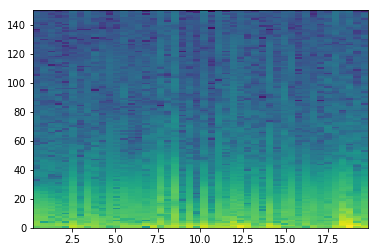

good List
[13, 22]
[9]
the temp 3
[[]]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


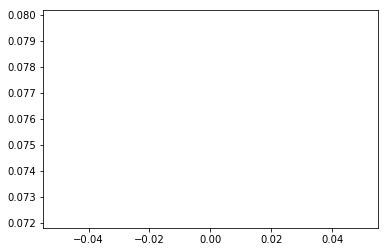

A00027
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


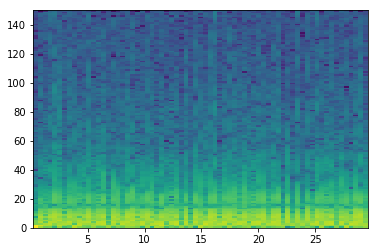

good List
[0, 1, 6, 10, 15, 16, 21, 22, 25, 29, 30, 32, 38, 42, 51, 53, 55, 62, 64]
[1, 5, 4, 5, 1, 5, 1, 3, 4, 1, 2, 6, 4, 9, 2, 2, 7, 2]
the temp 3
[[1], [], [], [5], [7], [], [10], [], [], [], [], [], [], []]
[0, 1]
longest
[0, 1]
indexList
[0, 1]
theMin
0
theMax
300


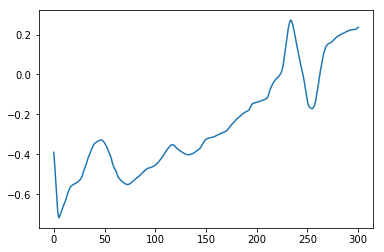

A00054
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


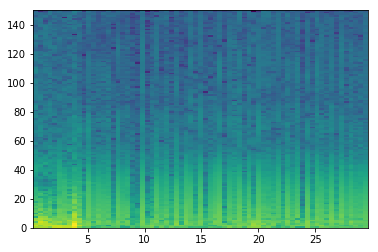

good List
[16, 21, 23, 35, 55, 64]
[5, 2, 12, 20, 9]
the temp 3
[[], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


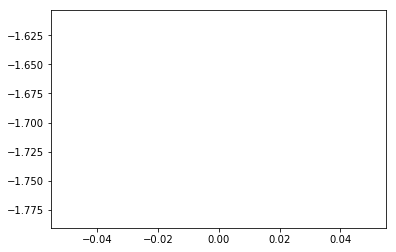

A00067
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


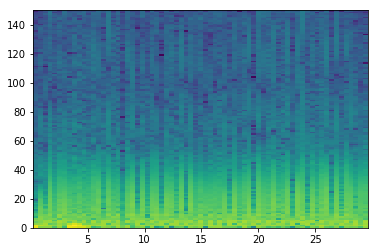

good List
[0, 2, 18, 33, 35, 42, 53, 63]
[2, 16, 15, 2, 7, 11, 10]
the temp 3
[[], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


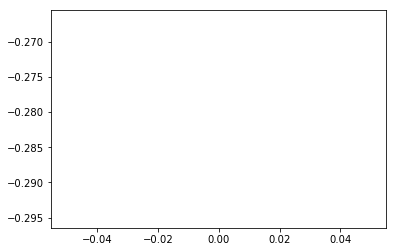

A00071
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


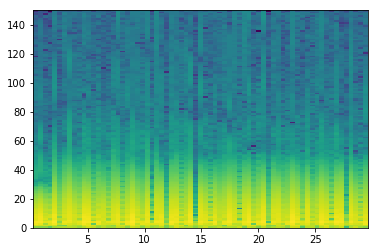

good List
[2, 3, 5, 8, 14, 33, 37, 45, 48, 57, 64, 66]
[1, 2, 3, 6, 19, 4, 8, 3, 9, 7, 2]
the temp 3
[[1], [], [], [], [], [], [], [], [], []]
[2, 3]
longest
[2, 3]
indexList
[2, 3]
theMin
300
theMax
600


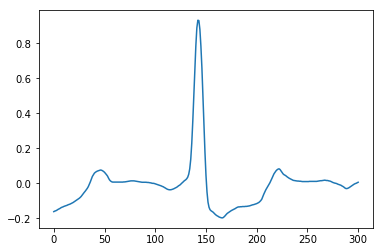

A00087
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


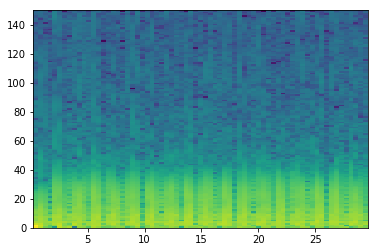

good List
[0, 39, 52, 60, 64]
[39, 13, 8, 4]
the temp 3
[[], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


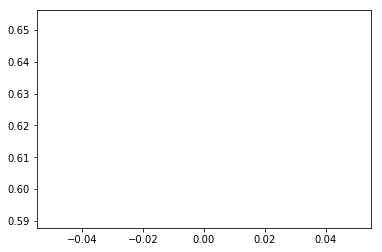

A00090
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


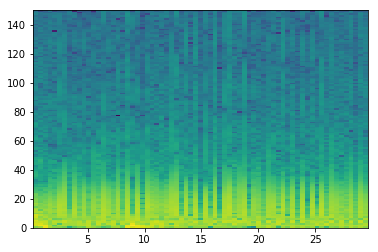

good List
[3, 34, 38]
[31, 4]
the temp 3
[[], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


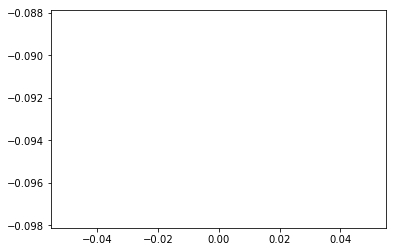

A00101
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


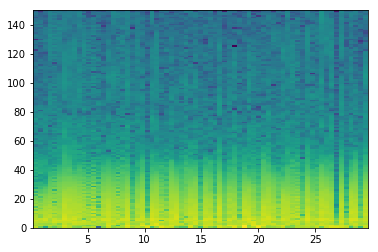

good List
[2, 14, 23, 29, 34, 36, 39, 62, 64, 67]
[12, 9, 6, 5, 2, 3, 23, 2, 3]
the temp 3
[[], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


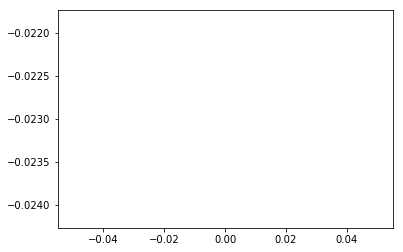

A00102
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


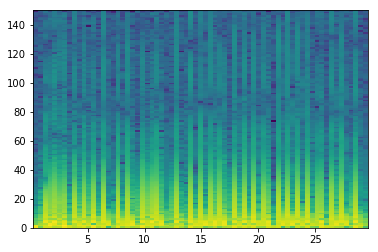

good List
[0, 1, 3, 7, 9, 11, 13, 15, 16, 18, 21, 27, 28, 30, 31, 33, 35, 40, 42, 44, 46, 49, 51, 53, 55, 57, 60, 62, 64, 65, 67, 68]
[1, 2, 4, 2, 2, 2, 2, 1, 2, 3, 6, 1, 2, 1, 2, 2, 5, 2, 2, 2, 3, 2, 2, 2, 2, 3, 2, 2, 1, 2, 1]
the temp 3
[[1], [], [], [], [], [], [8], [], [], [12], [14], [], [], [], [], [], [], [], [], [], [], [], [], [], [29]]
[0, 1]
longest
[0, 1]
indexList
[0, 1]
theMin
0
theMax
300


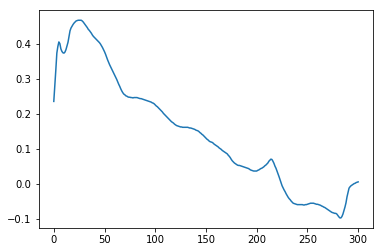

A00107
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


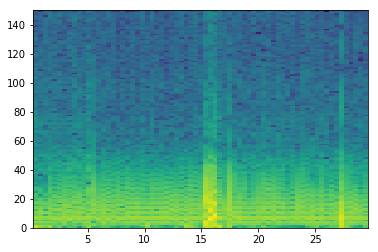

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


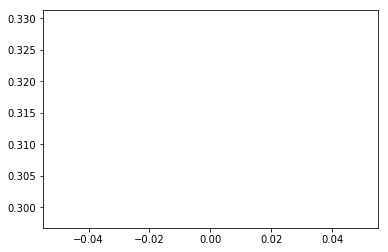

A00128
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333]


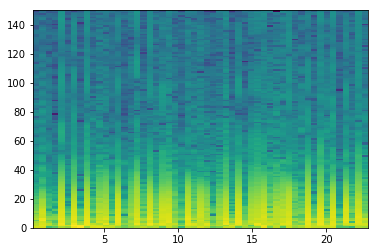

good List
[0, 2, 3, 5, 7, 9, 12, 14, 15, 17, 19, 23, 24, 26, 27, 28, 31, 33, 39, 44, 48, 50]
[2, 1, 2, 2, 2, 3, 2, 1, 2, 2, 4, 1, 2, 1, 1, 3, 2, 6, 5, 4, 2]
the temp 3
[[], [2], [], [], [], [], [8], [], [], [12], [14, 15], [], [], [], [], []]
[26, 27, 28]
longest
[26, 27, 28]
indexList
[26, 27, 28]
theMin
3300
theMax
3600


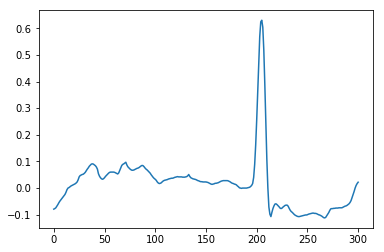

A00132
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


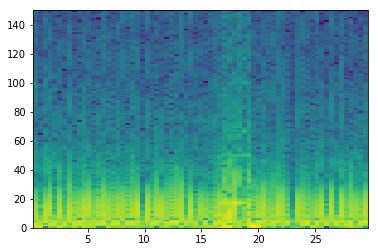

good List
[22, 32, 36, 46, 53, 60]
[10, 4, 10, 7, 7]
the temp 3
[[], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


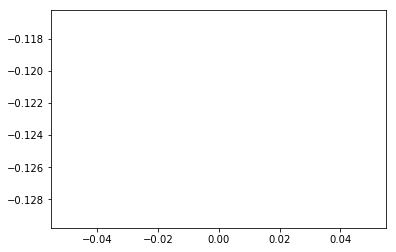

A00137
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


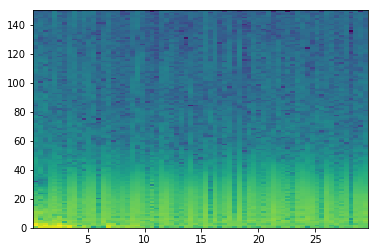

good List
[29, 38]
[9]
the temp 3
[[]]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


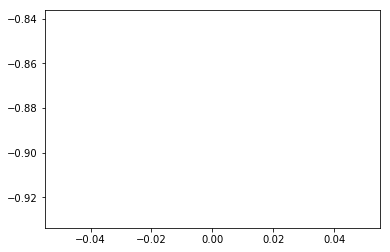

A00141
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64      ]


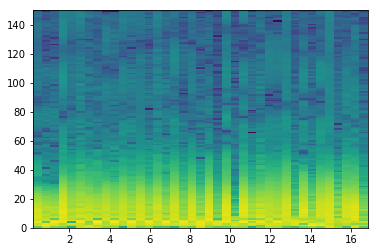

good List
[0, 2, 35]
[2, 33]
the temp 3
[[], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


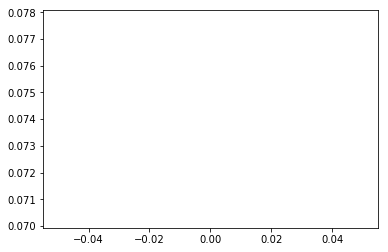

A00155
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


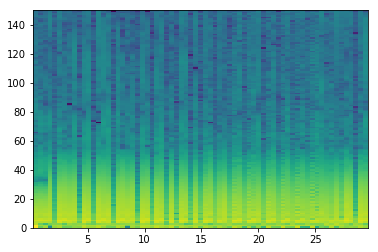

good List
[4, 9, 12, 16, 21, 24, 27, 29, 32, 34, 37, 40, 43, 47, 50, 53, 66]
[5, 3, 4, 5, 3, 3, 2, 3, 2, 3, 3, 3, 4, 3, 3, 13]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


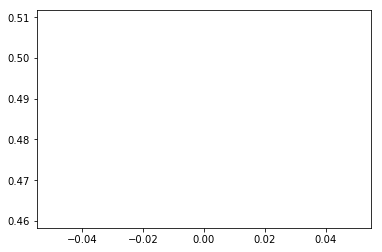

A00156
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


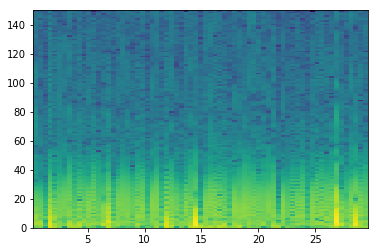

good List
[1, 2, 10, 14, 16, 17, 19, 20, 23, 26, 30, 34, 50, 52, 56, 63]
[1, 8, 4, 2, 1, 2, 1, 3, 3, 4, 4, 16, 2, 4, 7]
the temp 3
[[1], [], [], [5], [7], [], [], [], [], [], [], []]
[1, 2]
longest
[1, 2]
indexList
[1, 2]
theMin
0
theMax
300


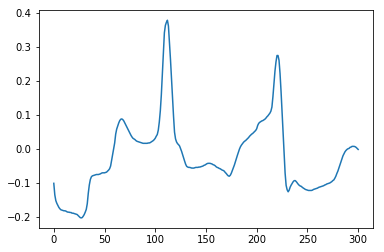

A00208
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


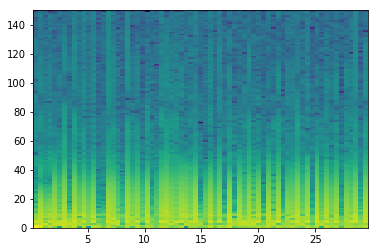

good List
[0, 7, 11, 13, 14, 18, 22, 24, 25, 30, 31, 34, 35, 37, 39, 41, 43, 47, 49, 51, 53, 55, 57, 61, 63, 67]
[7, 4, 2, 1, 4, 4, 2, 1, 5, 1, 3, 1, 2, 2, 2, 2, 4, 2, 2, 2, 2, 2, 4, 2, 4]
the temp 3
[[], [], [], [4], [], [], [8], [10], [12], [], [], [], [], [], [], [], [], [], [], [], []]
[13, 14]
longest
[13, 14]
indexList
[13, 14]
theMin
1500
theMax
1800


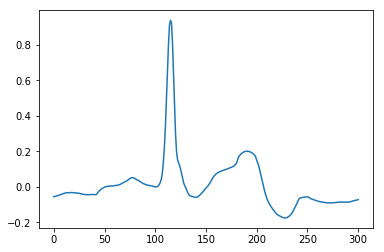

A00216
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


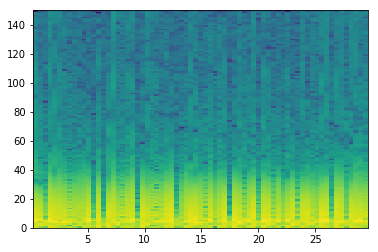

good List
[1, 2, 6, 7, 8, 10, 11, 12, 14, 17, 18, 21, 22, 23, 24, 26, 27, 29, 30, 31, 32, 33, 34, 35, 37, 39, 40, 41, 42, 44, 45, 46, 47, 49, 50, 51, 53, 54, 55, 56, 57, 59, 60, 61, 62, 63, 64]
[1, 4, 1, 1, 2, 1, 1, 2, 3, 1, 3, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1]
the temp 3
[[1], [3, 4], [6, 7], [], [10], [12, 13, 14], [16], [18, 19, 20, 21, 22, 23], [], [26, 27, 28], [30, 31, 32], [34, 35], [37, 38, 39, 40]]
[29, 30, 31, 32, 33, 34, 35]
longest
[29, 30, 31, 32, 33, 34, 35]
indexList
[29, 30, 31, 32, 33, 34, 35]
theMin
3600
theMax
4500


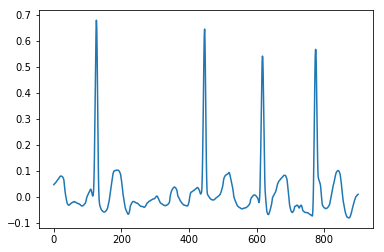

A00217
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


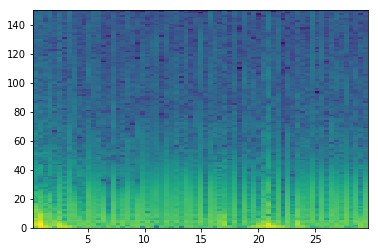

good List
[9, 10, 17, 24, 28, 35, 40, 42, 45, 46, 49, 51, 53, 58, 60, 65]
[1, 7, 7, 4, 7, 5, 2, 3, 1, 3, 2, 2, 5, 2, 5]
the temp 3
[[1], [], [], [], [], [], [], [9], [], [], [], [], []]
[9, 10]
longest
[9, 10]
indexList
[9, 10]
theMin
1200
theMax
1500


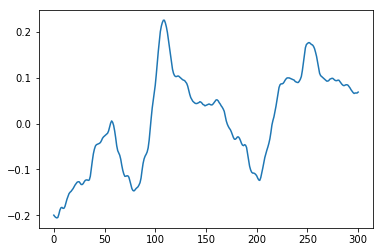

A00225
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


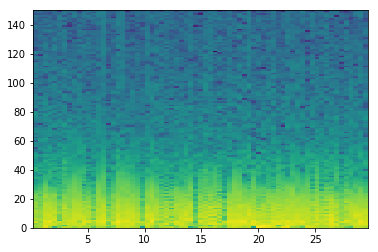

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


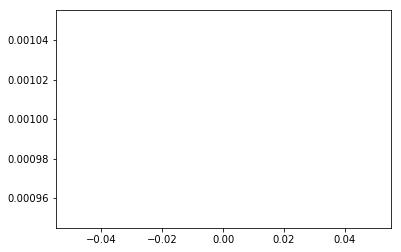

A00231
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

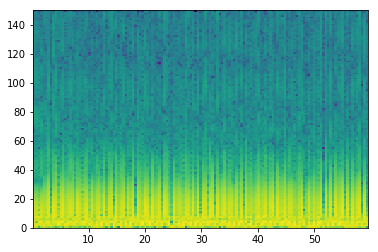

good List
[2, 4, 7, 11, 13, 25, 27, 28, 35, 38, 42, 48, 50, 52, 53, 57, 58, 59, 67, 69, 74, 75, 77, 78, 80, 82, 83, 85, 87, 89, 91, 92, 94, 97, 100, 101, 102, 103, 105, 107, 109, 112, 113, 115, 117, 120, 122, 124, 127, 129, 131, 133, 136, 138]
[2, 3, 4, 2, 12, 2, 1, 7, 3, 4, 6, 2, 2, 1, 4, 1, 1, 8, 2, 5, 1, 2, 1, 2, 2, 1, 2, 2, 2, 2, 1, 2, 3, 3, 1, 1, 1, 2, 2, 2, 3, 1, 2, 2, 3, 2, 2, 3, 2, 2, 2, 3, 2]
the temp 3
[[], [], [], [], [], [], [7], [], [], [], [], [], [14], [16, 17], [], [], [21], [23], [], [26], [], [], [], [31], [], [], [35, 36, 37], [], [], [], [42], [], [], [], [], [], [], [], [], [], []]
[100, 101, 102, 103]
longest
[100, 101, 102, 103]
indexList
[100, 101, 102, 103]
theMin
12900
theMax
13200


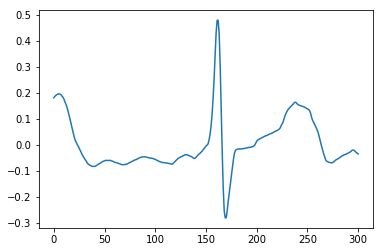

A00247
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


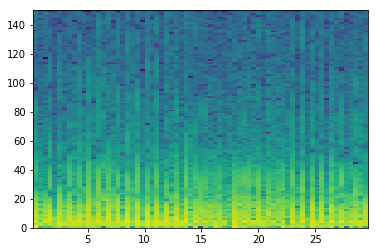

good List
[1, 2, 4, 6, 12, 22, 26, 27, 30, 34, 44, 47, 54, 56, 58, 60, 62, 64]
[1, 2, 2, 6, 10, 4, 1, 3, 4, 10, 3, 7, 2, 2, 2, 2, 2]
the temp 3
[[1], [], [], [], [], [7], [], [], [], [], [], [], [], [], []]
[1, 2]
longest
[1, 2]
indexList
[1, 2]
theMin
0
theMax
300


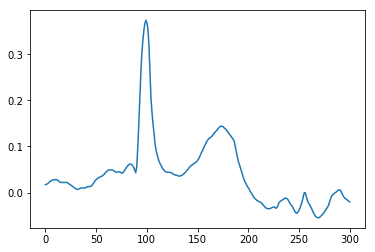

A00253
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


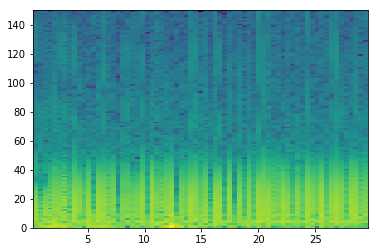

good List
[7, 17, 39, 41, 43, 51]
[10, 22, 2, 2, 8]
the temp 3
[[], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


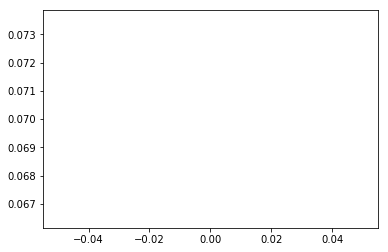

A00264
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

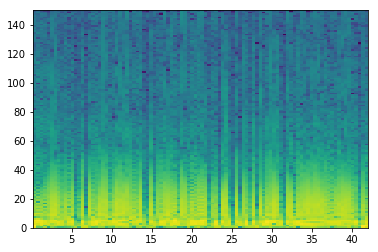

good List
[10, 12, 13, 15, 29, 32, 33, 35, 42, 44, 51, 54, 57, 58, 60, 63, 65, 67, 72, 73, 74, 94, 95]
[2, 1, 2, 14, 3, 1, 2, 7, 2, 7, 3, 3, 1, 2, 3, 2, 2, 5, 1, 1, 20, 1]
the temp 3
[[], [2], [], [], [6], [], [], [], [], [], [13], [], [], [], [], [19, 20]]
[72, 73, 74]
longest
[72, 73, 74]
indexList
[72, 73, 74]
theMin
9300
theMax
9600


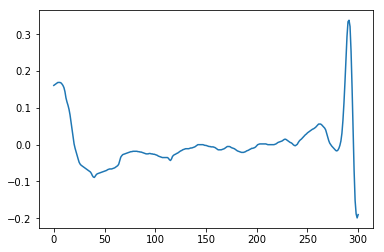

A00267
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


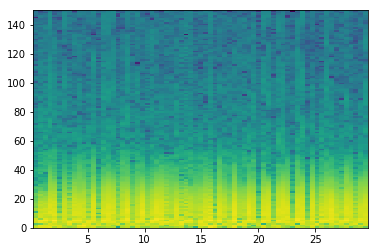

good List
[46, 49, 53, 56]
[3, 4, 3]
the temp 3
[[], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


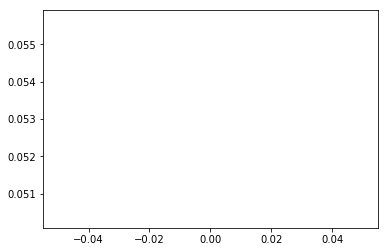

A00271
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


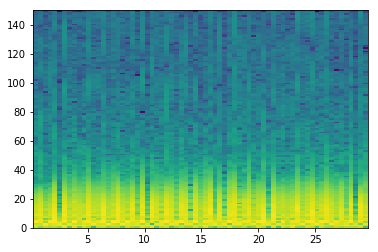

good List
[2, 3, 5, 16, 19, 29, 31, 34, 39, 66]
[1, 2, 11, 3, 10, 2, 3, 5, 27]
the temp 3
[[1], [], [], [], [], [], [], []]
[2, 3]
longest
[2, 3]
indexList
[2, 3]
theMin
300
theMax
600


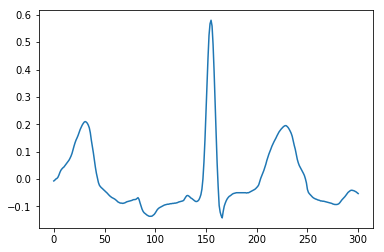

A00301
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


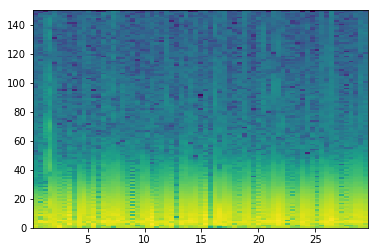

good List
[0, 5, 6, 11, 24, 27, 29, 33, 40, 41, 44, 45, 48, 52, 53, 54, 56, 58, 60, 61, 63]
[5, 1, 5, 13, 3, 2, 4, 7, 1, 3, 1, 3, 4, 1, 1, 2, 2, 2, 1, 2]
the temp 3
[[], [2], [], [], [], [], [], [9], [11], [], [14, 15], [], [], [19]]
[52, 53, 54]
longest
[52, 53, 54]
indexList
[52, 53, 54]
theMin
6600
theMax
6900


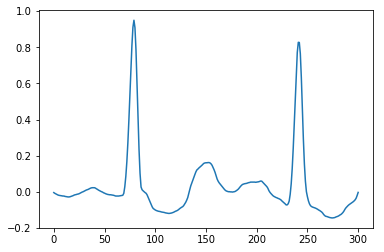

A00321
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


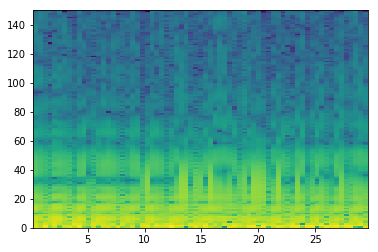

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


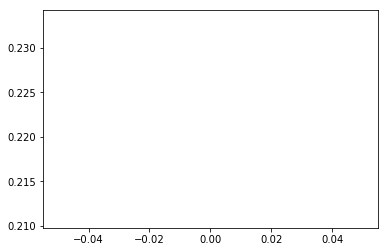

A00375
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


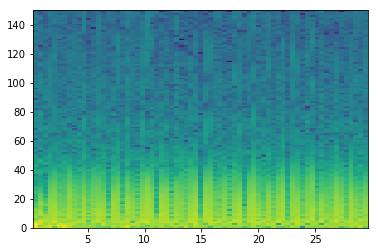

good List
[52]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


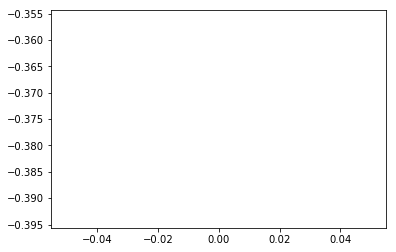

A00395
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

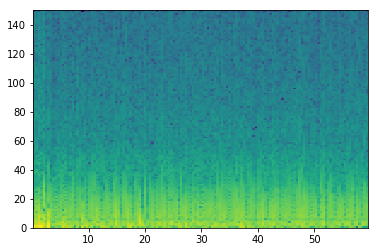

good List
[8, 82, 92]
[74, 10]
the temp 3
[[], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


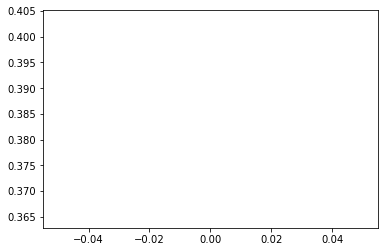

A00397
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8       ]


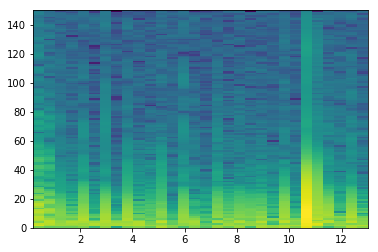

good List
[2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 26, 27, 29]
[1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 2]
the temp 3
[[1, 2, 3, 4, 5, 6, 7, 8], [10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20], [22]]
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
longest
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
indexList
[12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
theMin
1500
theMax
3000


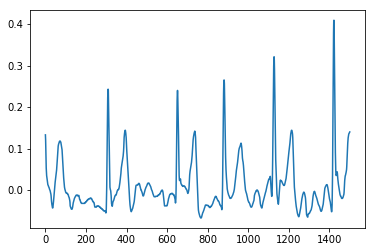

A00404
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


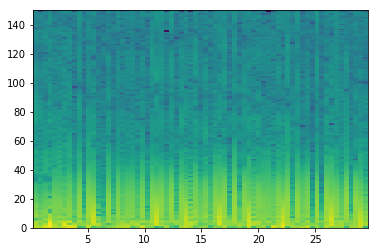

good List
[1, 8, 10, 13, 14, 16, 17, 18, 19, 20, 21, 23, 25, 26, 27, 28, 29, 34, 36, 40, 42, 43, 46, 49, 53, 55, 56, 57, 59, 63, 65, 66]
[7, 2, 3, 1, 2, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 5, 2, 4, 2, 1, 3, 3, 4, 2, 1, 1, 2, 4, 2, 1]
the temp 3
[[], [], [], [4], [6, 7, 8, 9, 10], [], [13, 14, 15, 16], [], [], [], [21], [], [], [], [26, 27], [], []]
[16, 17, 18, 19, 20, 21]
longest
[16, 17, 18, 19, 20, 21]
indexList
[16, 17, 18, 19, 20, 21]
theMin
2100
theMax
2700


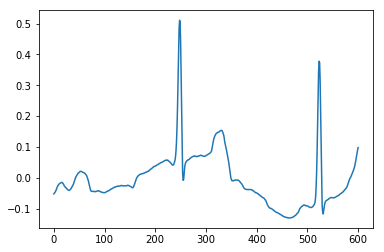

A00405
[ 0.42666667  0.85333333  1.28        1.70666667  2.13333333
  2.56        2.98666667  3.41333333  3.84        4.26666667
  4.69333333  5.12        5.54666667  5.97333333  6.4         6.82666667
  7.25333333  7.68        8.10666667  8.53333333  8.96
  9.38666667]


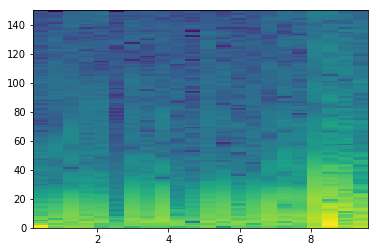

good List
[0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15]
[3, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
the temp 3
[[]]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


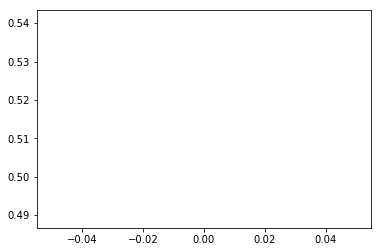

A00422
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


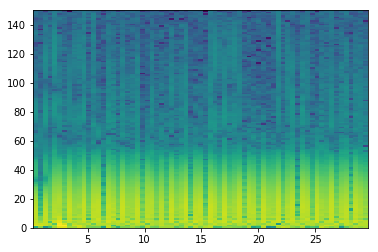

good List
[0, 1, 3, 14, 54]
[1, 2, 11, 40]
the temp 3
[[1], [], []]
[0, 1]
longest
[0, 1]
indexList
[0, 1]
theMin
0
theMax
300


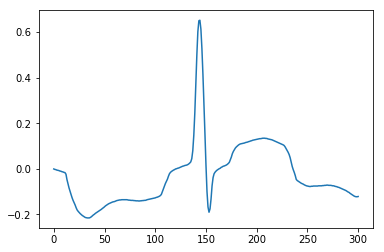

A00432
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


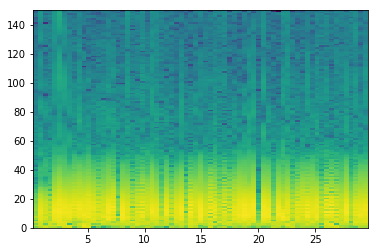

good List
[12, 13, 18, 27, 29, 31, 38, 46, 65]
[1, 5, 9, 2, 2, 7, 8, 19]
the temp 3
[[1], [], [], [], [], [], []]
[12, 13]
longest
[12, 13]
indexList
[12, 13]
theMin
1500
theMax
1800


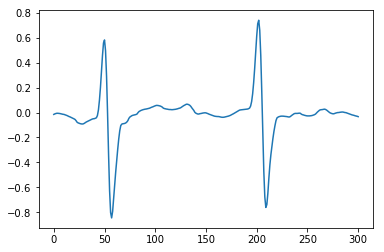

A00438
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667]


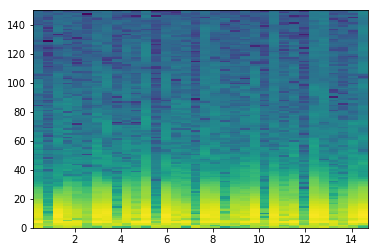

good List
[1, 4, 5, 8, 12, 15, 16, 27, 29, 30]
[3, 1, 3, 4, 3, 1, 11, 2, 1]
the temp 3
[[], [2], [], [], [6], []]
[4, 5]
longest
[4, 5]
indexList
[4, 5]
theMin
600
theMax
900


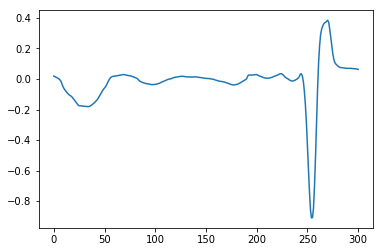

A00439
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

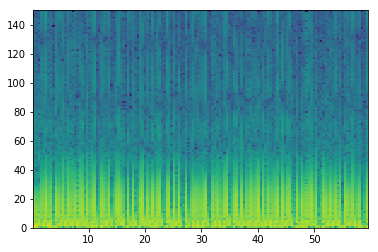

good List
[8, 17, 21, 26, 38, 43, 53, 54, 61, 62, 64, 67, 69, 72, 73, 78, 79, 82, 85, 87, 107, 108, 110, 112, 116, 118, 124, 128, 136, 137]
[9, 4, 5, 12, 5, 10, 1, 7, 1, 2, 3, 2, 3, 1, 5, 1, 3, 3, 2, 20, 1, 2, 2, 4, 2, 6, 4, 8, 1]
the temp 3
[[], [], [], [], [], [], [7], [9], [], [], [], [14], [16], [], [], [], [21], [], [], [], [], [], []]
[53, 54]
longest
[53, 54]
indexList
[53, 54]
theMin
6900
theMax
7200


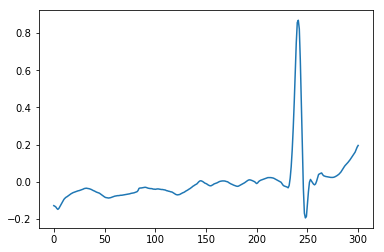

A00441
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333]


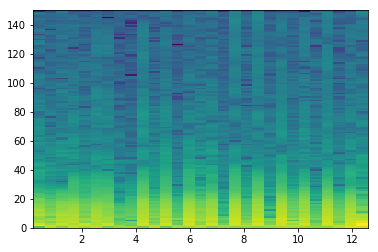

good List
[4, 7, 8, 12, 16, 18, 20, 22, 26]
[3, 1, 4, 4, 2, 2, 2, 4]
the temp 3
[[], [2], [], [], [], [], []]
[7, 8]
longest
[7, 8]
indexList
[7, 8]
theMin
900
theMax
1200


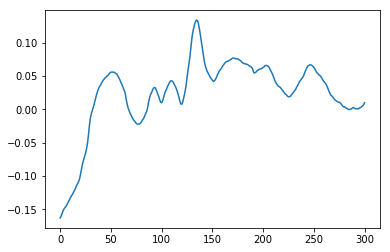

A00456
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


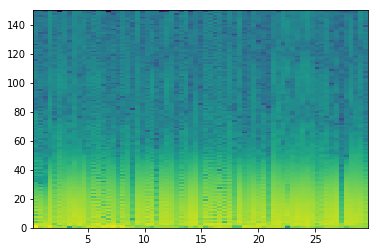

good List
[1, 2, 17, 20, 29, 43, 48, 63, 64]
[1, 15, 3, 9, 14, 5, 15, 1]
the temp 3
[[1], [], [], [], [], []]
[1, 2]
longest
[1, 2]
indexList
[1, 2]
theMin
0
theMax
300


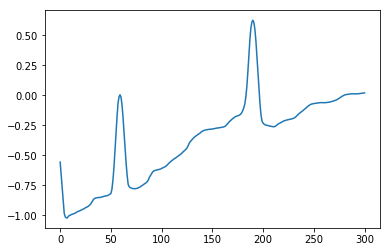

A00465
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


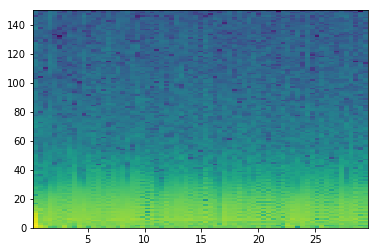

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


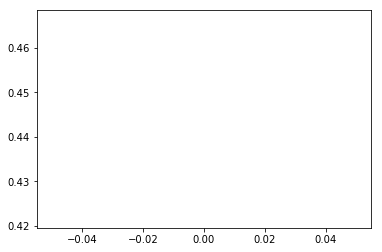

A00473
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


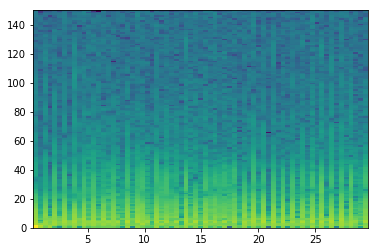

good List
[0, 1, 2, 3, 5, 6, 7, 9, 10, 14, 15, 17, 18, 20, 24, 26, 28, 30, 32, 34, 36, 38, 39, 40, 42, 43, 44, 46, 47, 48, 50, 51, 52, 53, 54, 56, 58, 60, 62, 64, 65, 66, 67]
[1, 1, 1, 2, 1, 1, 2, 1, 4, 1, 2, 1, 2, 4, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1]
the temp 3
[[1, 2, 3], [5, 6], [8], [10], [12], [], [], [], [], [], [], [], [], [22, 23], [25, 26], [28, 29], [31, 32, 33, 34], [], [], [], []]
[50, 51, 52, 53, 54]
longest
[50, 51, 52, 53, 54]
indexList
[50, 51, 52, 53, 54]
theMin
6300
theMax
6900


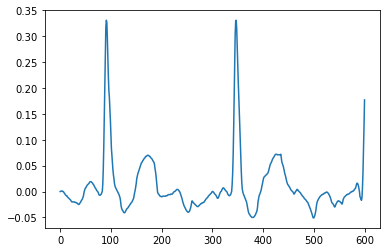

A00486
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


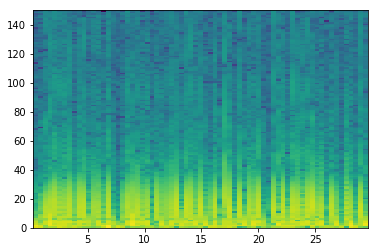

good List
[0, 1, 8, 14, 16, 17, 18, 24, 25, 27, 30, 35, 36, 38, 41, 43, 47, 48, 52, 60, 61, 62, 63, 66, 68]
[1, 7, 6, 2, 1, 1, 6, 1, 2, 3, 5, 1, 2, 3, 2, 4, 1, 4, 8, 1, 1, 1, 3, 2]
the temp 3
[[1], [], [], [5, 6], [8], [], [], [12], [], [], [], [17], [], [20, 21, 22], []]
[60, 61, 62, 63]
longest
[60, 61, 62, 63]
indexList
[60, 61, 62, 63]
theMin
7800
theMax
8100


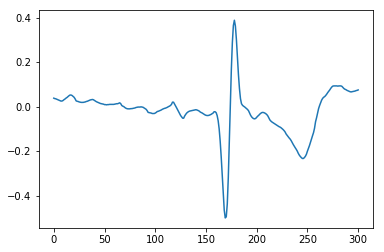

A00493
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

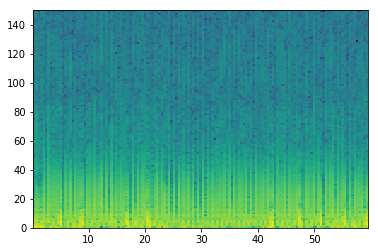

good List
[0, 2, 3, 5, 9, 10, 12, 15, 16, 21, 26, 27, 29, 31, 33, 35, 37, 39, 40, 42, 49, 52, 54, 55, 57, 59, 60, 61, 63, 65, 67, 68, 69, 71, 73, 75, 77, 80, 82, 84, 86, 91, 93, 95, 96, 98, 100, 103, 105, 107, 108, 112, 117, 120, 125, 127, 129, 130, 132, 134, 135, 136, 137]
[2, 1, 2, 4, 1, 2, 3, 1, 5, 5, 1, 2, 2, 2, 2, 2, 2, 1, 2, 7, 3, 2, 1, 2, 2, 1, 1, 2, 2, 2, 1, 1, 2, 2, 2, 2, 3, 2, 2, 2, 5, 2, 2, 1, 2, 2, 3, 2, 2, 1, 4, 5, 3, 5, 2, 2, 1, 2, 2, 1, 1, 1]
the temp 3
[[], [2], [], [5], [], [8], [], [11], [], [], [], [], [], [18], [], [], [], [23], [], [26, 27], [], [], [31, 32], [], [], [], [], [], [], [], [], [], [], [44], [], [], [], [], [50], [], [], [], [], [], [57], []]
[59, 60, 61]
longest
[59, 60, 61]
indexList
[59, 60, 61]
theMin
7500
theMax
7800


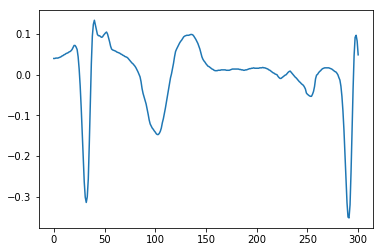

A00509
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


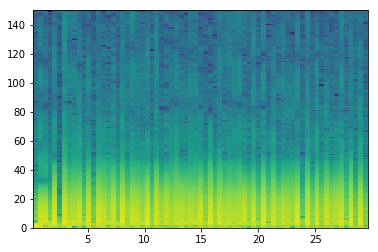

good List
[0, 3, 5, 12, 17, 24, 26, 30, 31, 35, 37, 39, 44, 46, 48, 50, 51, 52, 55, 57, 59, 61, 66, 68]
[3, 2, 7, 5, 7, 2, 4, 1, 4, 2, 2, 5, 2, 2, 2, 1, 1, 3, 2, 2, 2, 5, 2]
the temp 3
[[], [], [], [], [], [], [], [8], [], [], [], [], [], [], [16, 17], [], [], [], [], []]
[50, 51, 52]
longest
[50, 51, 52]
indexList
[50, 51, 52]
theMin
6300
theMax
6600


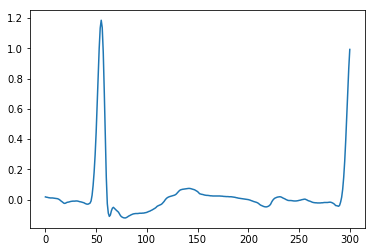

A00519
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


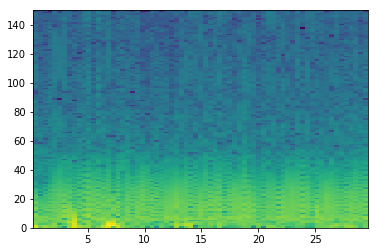

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


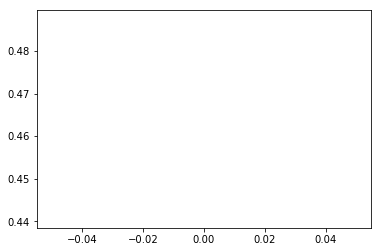

A00520
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


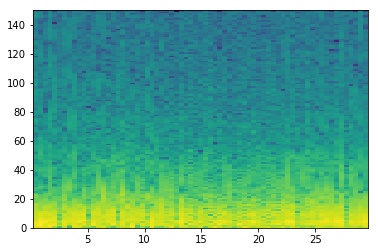

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


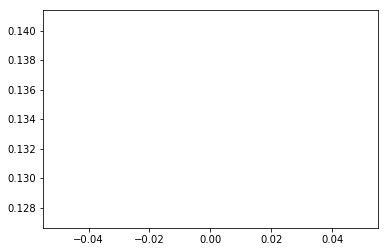

A00542
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


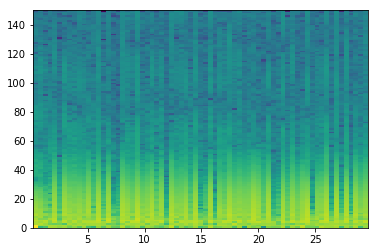

good List
[2, 5, 14, 16, 17, 25, 27, 34, 35, 37, 41, 49, 50, 52, 54, 57, 58, 61, 63, 65, 67]
[3, 9, 2, 1, 8, 2, 7, 1, 2, 4, 8, 1, 2, 2, 3, 1, 3, 2, 2, 2]
the temp 3
[[], [], [], [4], [], [], [8], [], [], [12], [], [], [16], [], [], []]
[16, 17]
longest
[16, 17]
indexList
[16, 17]
theMin
2100
theMax
2400


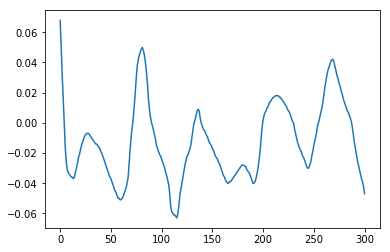

A00551
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


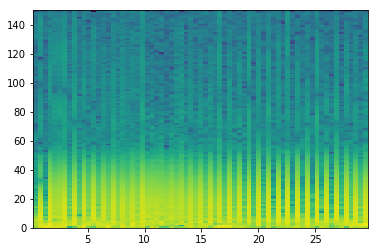

good List
[0, 2, 7, 9, 13, 35, 37, 39, 41, 43, 45, 47, 49, 53, 55, 57, 59, 61, 63, 65]
[2, 5, 2, 4, 22, 2, 2, 2, 2, 2, 2, 2, 4, 2, 2, 2, 2, 2, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


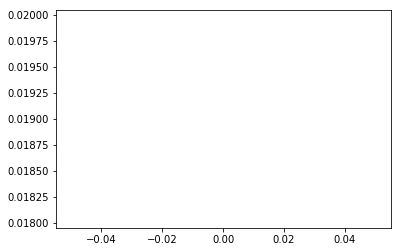

A00567
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


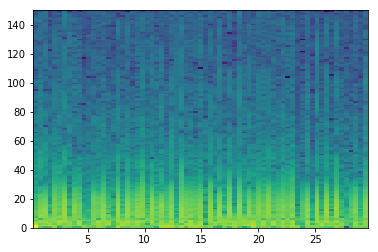

good List
[8, 9, 10, 11, 15, 16, 20, 23, 25, 41, 43, 54, 55, 57, 59, 61, 63, 65, 67]
[1, 1, 1, 4, 1, 4, 3, 2, 16, 2, 11, 1, 2, 2, 2, 2, 2, 2]
the temp 3
[[1, 2, 3], [5], [], [], [], [], [], [12], [], [], [], [], []]
[8, 9, 10, 11]
longest
[8, 9, 10, 11]
indexList
[8, 9, 10, 11]
theMin
900
theMax
1500


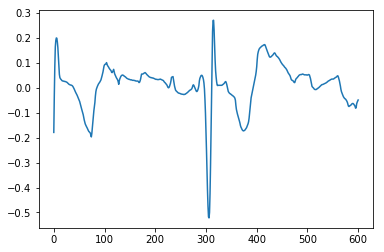

A00587
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

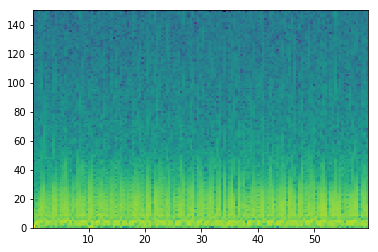

good List
[6, 9, 10, 16, 32, 33, 37, 39, 42, 57, 59, 63, 67, 80, 104, 109, 128, 135]
[3, 1, 6, 16, 1, 4, 2, 3, 15, 2, 4, 4, 13, 24, 5, 19, 7]
the temp 3
[[], [2], [], [5], [], [], [], [], [], [], [], [], [], [], []]
[9, 10]
longest
[9, 10]
indexList
[9, 10]
theMin
1200
theMax
1500


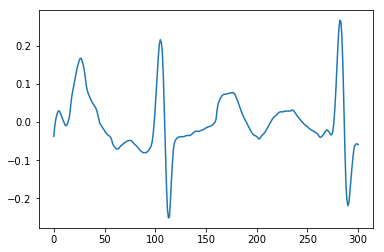

A00589
[ 0.42666667  0.85333333  1.28        1.70666667  2.13333333
  2.56        2.98666667  3.41333333  3.84        4.26666667
  4.69333333  5.12        5.54666667  5.97333333  6.4         6.82666667
  7.25333333  7.68        8.10666667  8.53333333  8.96
  9.38666667]


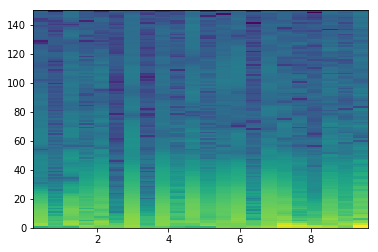

good List
[1, 3, 5, 7, 11, 12, 14, 17, 18]
[2, 2, 2, 4, 1, 2, 3, 1]
the temp 3
[[], [], [], [], [5], []]
[11, 12]
longest
[11, 12]
indexList
[11, 12]
theMin
1500
theMax
1800


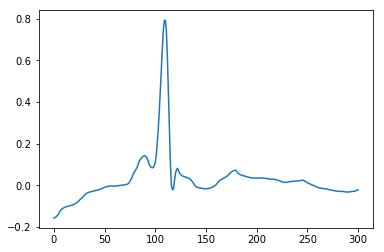

A00592
[ 0.42666667  0.85333333  1.28        1.70666667  2.13333333
  2.56        2.98666667  3.41333333  3.84        4.26666667
  4.69333333  5.12        5.54666667  5.97333333  6.4         6.82666667
  7.25333333  7.68        8.10666667  8.53333333  8.96
  9.38666667]


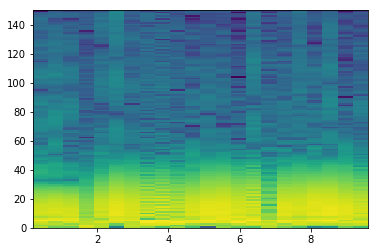

good List
[2, 3]
[1]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


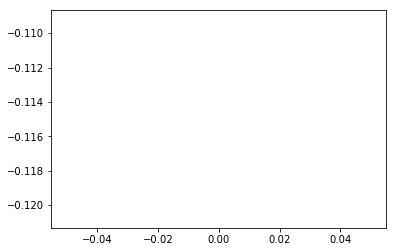

A00611
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667]


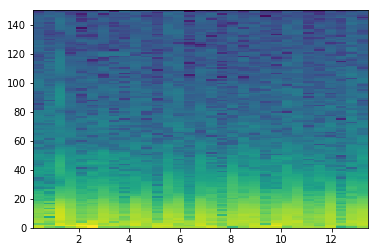

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


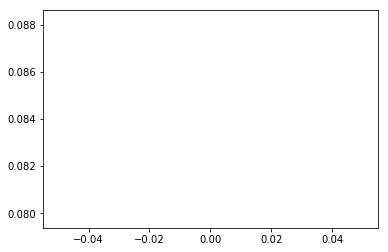

A00613
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

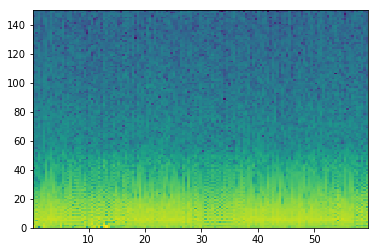

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


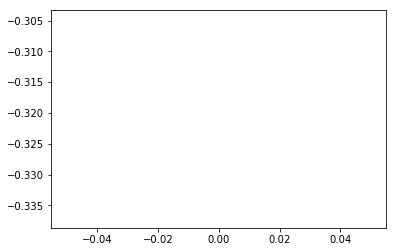

A00614
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


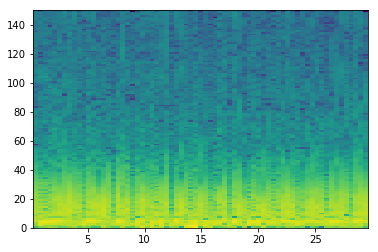

good List
[20, 36, 44, 52, 63]
[16, 8, 8, 11]
the temp 3
[[], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


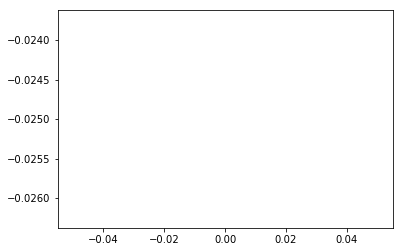

A00621
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


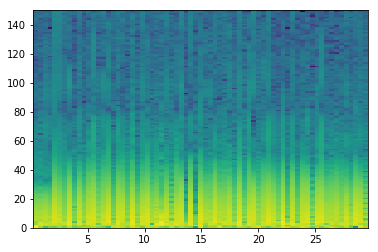

good List
[0, 3, 16, 21, 24, 31, 35, 45, 49, 50, 52, 54, 57, 65]
[3, 13, 5, 3, 7, 4, 10, 4, 1, 2, 2, 3, 8]
the temp 3
[[], [], [], [], [], [], [], [], [9], [], [], []]
[49, 50]
longest
[49, 50]
indexList
[49, 50]
theMin
6300
theMax
6600


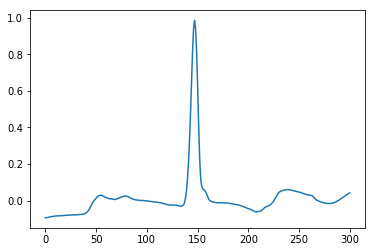

A00624
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


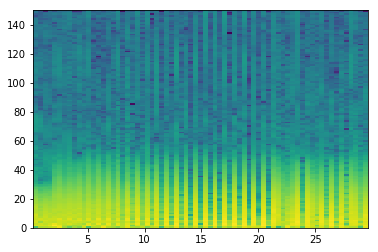

good List
[1, 3, 4, 8, 9, 10, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 44, 46, 48, 57, 58, 60, 61, 62]
[2, 1, 4, 1, 1, 8, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 9, 1, 2, 1, 1]
the temp 3
[[], [2], [4, 5], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [23]]
[8, 9, 10]
longest
[8, 9, 10]
indexList
[8, 9, 10]
theMin
900
theMax
1200


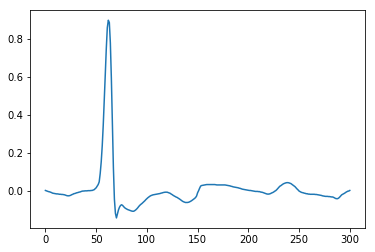

A00625
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


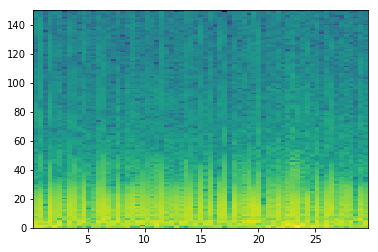

good List
[2, 4, 6, 8, 9, 10, 12, 16, 20, 30, 34, 37, 38, 40, 42, 47, 62, 65, 66, 68]
[2, 2, 2, 1, 1, 2, 4, 4, 10, 4, 3, 1, 2, 2, 5, 15, 3, 1, 2]
the temp 3
[[], [], [], [4, 5], [], [], [], [], [], [12], [], [], [], [], [18]]
[8, 9, 10]
longest
[8, 9, 10]
indexList
[8, 9, 10]
theMin
900
theMax
1200


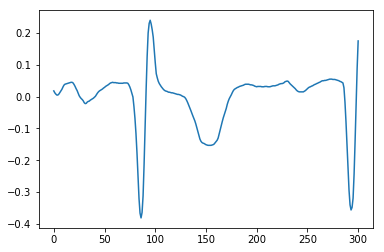

A00643
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

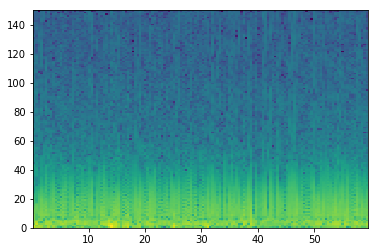

good List
[19, 26, 27, 41, 58, 72, 78, 91, 93, 94, 99, 104]
[7, 1, 14, 17, 14, 6, 13, 2, 1, 5, 5]
the temp 3
[[], [2], [], [], [], [], [], [9], []]
[26, 27]
longest
[26, 27]
indexList
[26, 27]
theMin
3300
theMax
3600


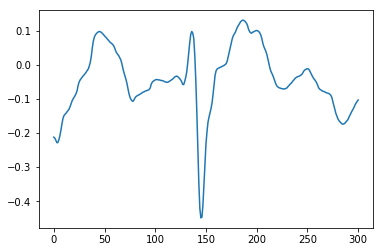

A00648
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333]


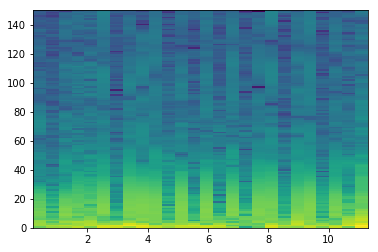

good List
[1, 22]
[21]
the temp 3
[[]]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


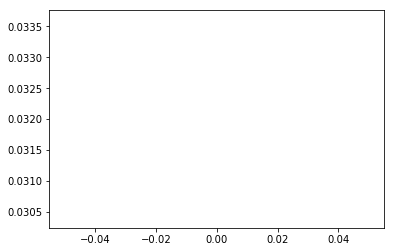

A00662
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


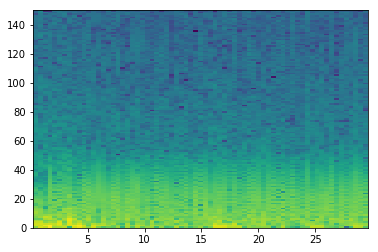

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


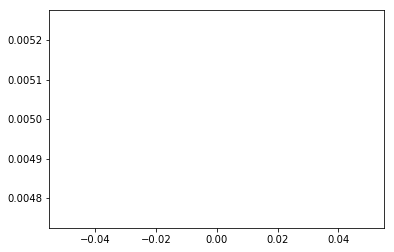

A00666
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


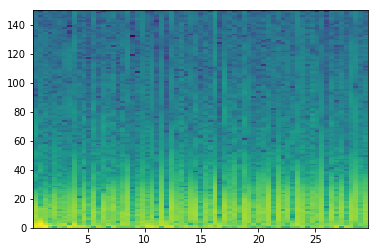

good List
[11, 20, 27, 38, 64]
[9, 7, 11, 26]
the temp 3
[[], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


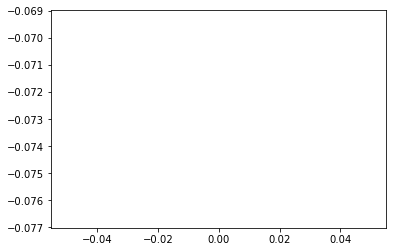

A00670
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


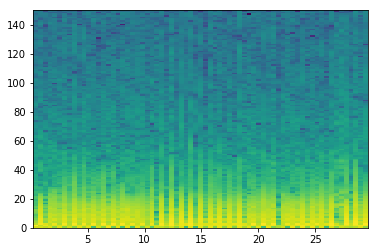

good List
[17, 31, 35, 41]
[14, 4, 6]
the temp 3
[[], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


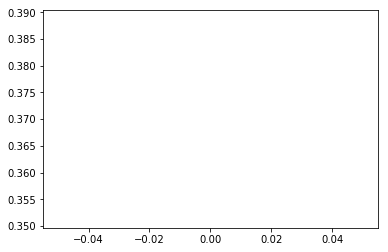

A00680
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


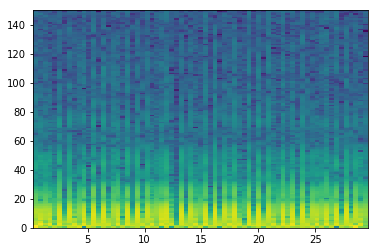

good List
[4, 6, 8, 9, 11, 13, 15, 18, 20, 22, 29, 31, 33, 34, 36, 38, 40, 42, 43, 45, 47, 49, 50, 52, 54, 56, 61, 63, 65]
[2, 2, 1, 2, 2, 2, 3, 2, 2, 7, 2, 2, 1, 2, 2, 2, 2, 1, 2, 2, 2, 1, 2, 2, 2, 5, 2, 2]
the temp 3
[[], [], [3], [], [], [], [], [], [], [], [], [13], [], [], [], [18], [], [], [22], [], [], [], [], []]
[8, 9]
longest
[8, 9]
indexList
[8, 9]
theMin
900
theMax
1200


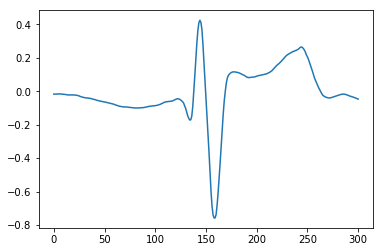

A00691
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


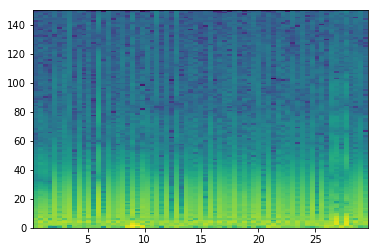

good List
[3, 5, 8, 10, 12, 14, 16, 19, 26, 28, 30, 34, 35, 37, 39, 42, 44, 47, 49, 54, 58, 65, 68]
[2, 3, 2, 2, 2, 2, 3, 7, 2, 2, 4, 1, 2, 2, 3, 2, 3, 2, 5, 4, 7, 3]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [12], [], [], [], [], [], [], [], [], []]
[34, 35]
longest
[34, 35]
indexList
[34, 35]
theMin
4200
theMax
4500


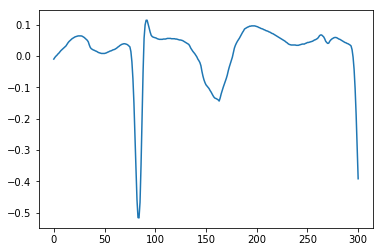

A00701
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333]


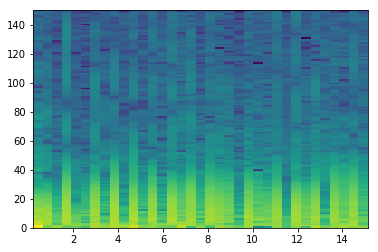

good List
[2, 4, 5, 9, 11, 12, 17, 21, 24, 25, 26, 28, 34]
[2, 1, 4, 2, 1, 5, 4, 3, 1, 1, 2, 6]
the temp 3
[[], [2], [], [5], [], [], [9, 10], []]
[24, 25, 26]
longest
[24, 25, 26]
indexList
[24, 25, 26]
theMin
3000
theMax
3300


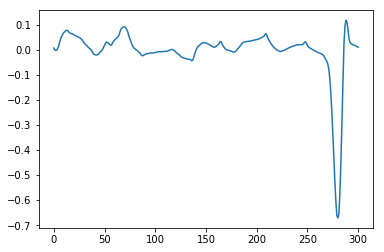

A00704
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


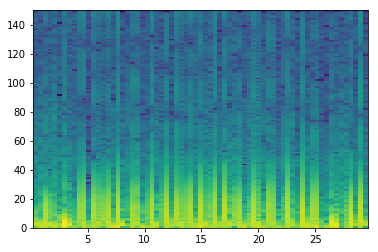

good List
[0, 5, 8, 11, 12, 13, 14, 16, 18, 19, 22, 23, 26, 28, 31, 33, 38, 43, 47, 48, 50, 54, 56, 59, 60, 66, 68]
[5, 3, 3, 1, 1, 1, 2, 2, 1, 3, 1, 3, 2, 3, 2, 5, 5, 4, 1, 2, 4, 2, 3, 1, 6, 2]
the temp 3
[[], [], [], [4, 5, 6], [], [9], [11], [], [], [], [], [], [], [19], [], [], [], [24], []]
[11, 12, 13, 14]
longest
[11, 12, 13, 14]
indexList
[11, 12, 13, 14]
theMin
1500
theMax
1800


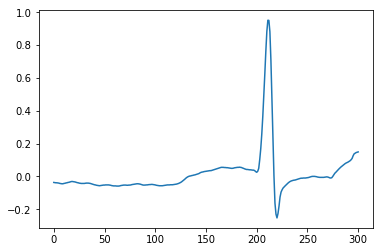

A00706
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667]


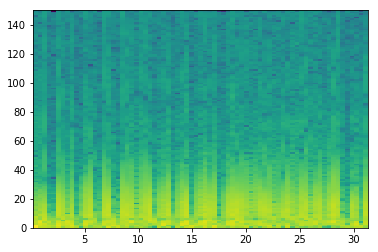

good List
[0, 1, 3, 4, 6, 7, 9, 10, 11, 13, 14, 16, 17, 18, 22, 25, 26, 27, 30, 31, 32, 34, 35, 40, 41, 46, 55, 63, 68, 71]
[1, 2, 1, 2, 1, 2, 1, 1, 2, 1, 2, 1, 1, 4, 3, 1, 1, 3, 1, 1, 2, 1, 5, 1, 5, 9, 8, 5, 3]
the temp 3
[[1], [3], [5], [7, 8], [10], [12, 13], [], [16, 17], [19, 20], [22], [24], [], [], [], []]
[9, 10, 11]
longest
[9, 10, 11]
indexList
[9, 10, 11]
theMin
1200
theMax
1500


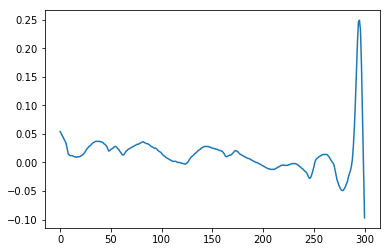

A00707
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

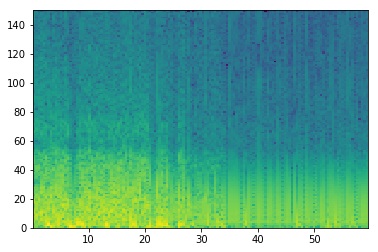

good List
[114, 125, 136]
[11, 11]
the temp 3
[[], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


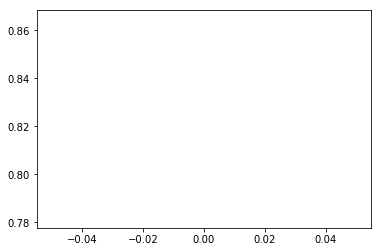

A00722
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


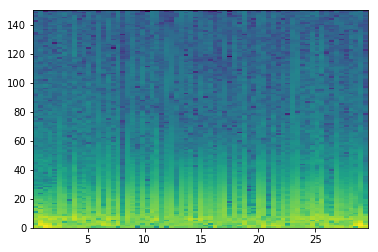

good List
[18, 26, 44, 45, 48, 50]
[8, 18, 1, 3, 2]
the temp 3
[[], [], [3], []]
[44, 45]
longest
[44, 45]
indexList
[44, 45]
theMin
5700
theMax
6000


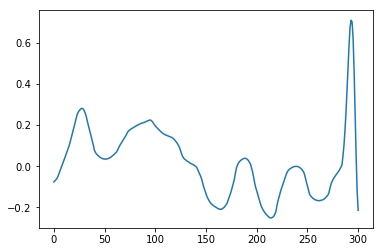

A00725
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


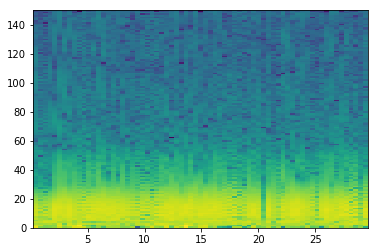

good List
[3]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


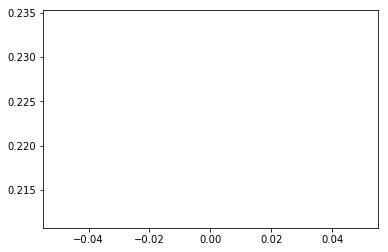

A00733
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


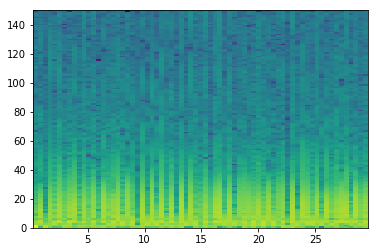

good List
[2, 21, 29, 31, 34, 36, 41, 42, 49, 52, 65]
[19, 8, 2, 3, 2, 5, 1, 7, 3, 13]
the temp 3
[[], [], [], [], [], [], [7], [], []]
[41, 42]
longest
[41, 42]
indexList
[41, 42]
theMin
5100
theMax
5400


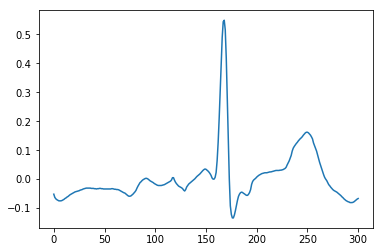

A00739
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


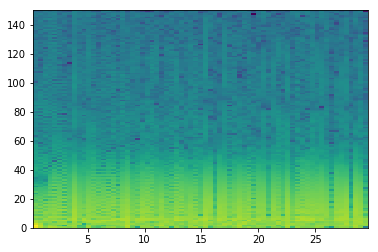

good List
[17, 20, 32, 37, 43, 53, 68]
[3, 12, 5, 6, 10, 15]
the temp 3
[[], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


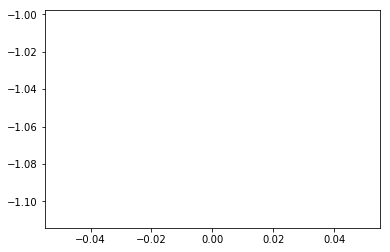

A00772
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


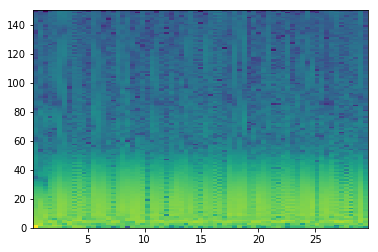

good List
[11, 27, 32, 44, 60, 68]
[16, 5, 12, 16, 8]
the temp 3
[[], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


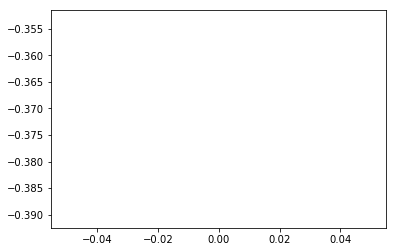

A00795
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


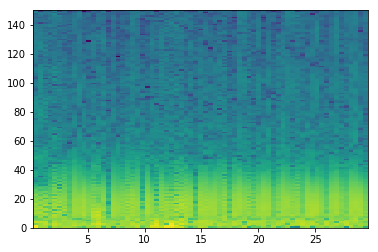

good List
[6, 15, 33, 40, 49, 68]
[9, 18, 7, 9, 19]
the temp 3
[[], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


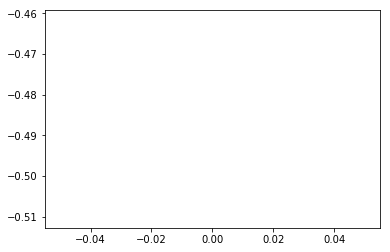

A00798
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667]


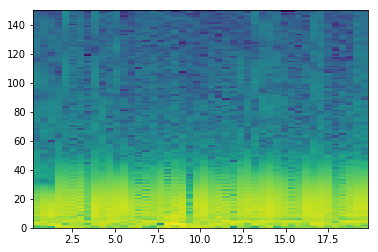

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


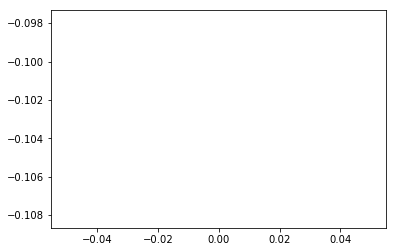

A00837
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


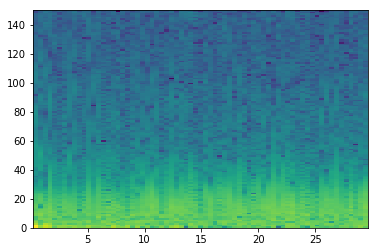

good List
[5, 10, 18, 19, 22, 26, 27, 30, 33, 34, 37, 40, 41, 44, 48, 54, 55, 58, 66]
[5, 8, 1, 3, 4, 1, 3, 3, 1, 3, 3, 1, 3, 4, 6, 1, 3, 8]
the temp 3
[[], [], [3], [], [6], [], [9], [], [12], [], [], [16], []]
[18, 19]
longest
[18, 19]
indexList
[18, 19]
theMin
2400
theMax
2700


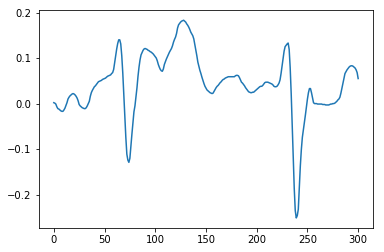

A00860
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


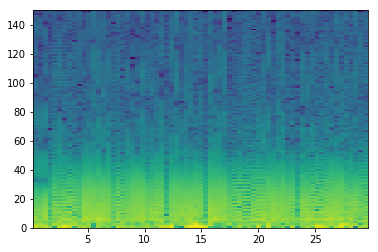

good List
[8, 35, 43]
[27, 8]
the temp 3
[[], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


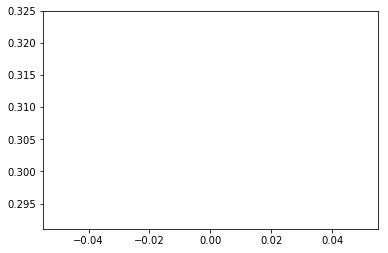

A00867
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


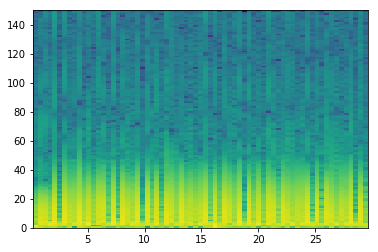

good List
[0, 3, 5, 7, 8, 10, 12, 13, 15, 17, 20, 22, 30, 31, 33, 34, 36, 37, 38, 41, 43, 45, 47, 54, 55, 57, 66, 68]
[3, 2, 2, 1, 2, 2, 1, 2, 2, 3, 2, 8, 1, 2, 1, 2, 1, 1, 3, 2, 2, 2, 7, 1, 2, 9, 2]
the temp 3
[[], [], [], [4], [], [7], [], [], [], [], [13], [15], [17, 18], [], [], [], [], [24], [], []]
[36, 37, 38]
longest
[36, 37, 38]
indexList
[36, 37, 38]
theMin
4500
theMax
4800


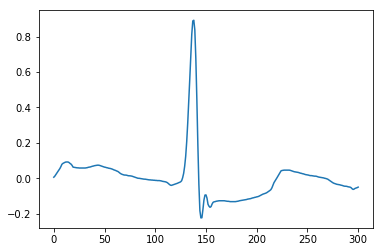

A00869
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


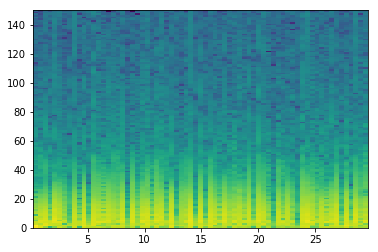

good List
[7, 9, 19, 29, 33, 53, 54, 65]
[2, 10, 10, 4, 20, 1, 11]
the temp 3
[[], [], [], [], [], [6]]
[53, 54]
longest
[53, 54]
indexList
[53, 54]
theMin
6900
theMax
7200


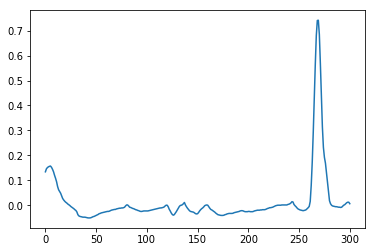

A00873
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


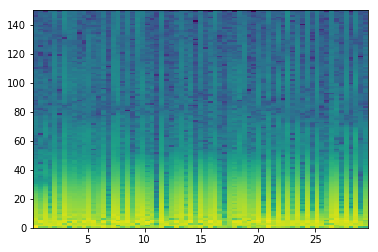

good List
[0, 15, 20, 23, 25, 27, 33, 35, 38, 39, 47, 53, 57, 59, 60, 65, 67]
[15, 5, 3, 2, 2, 6, 2, 3, 1, 8, 6, 4, 2, 1, 5, 2]
the temp 3
[[], [], [], [], [], [], [], [], [9], [], [], [], [14], []]
[38, 39]
longest
[38, 39]
indexList
[38, 39]
theMin
4800
theMax
5100


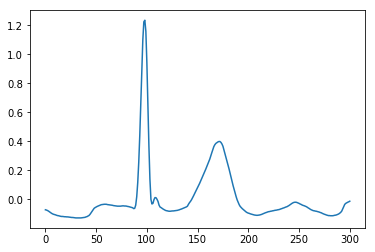

A00885
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


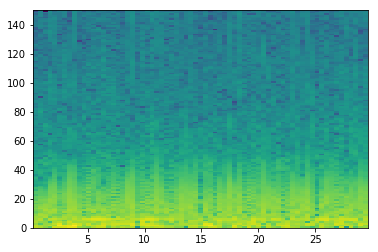

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


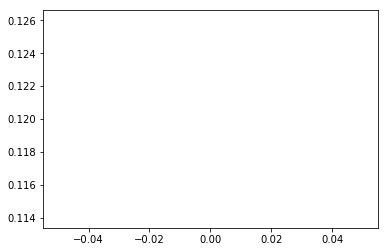

A00888
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


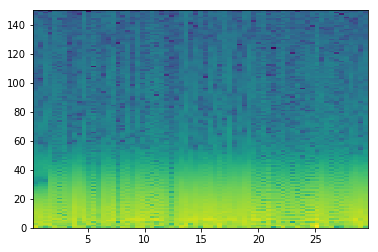

good List
[4, 28, 46]
[24, 18]
the temp 3
[[], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


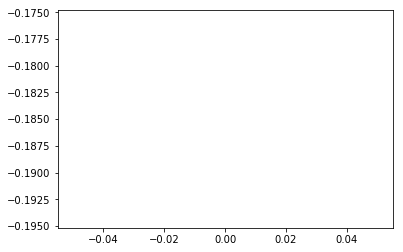

A00925
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


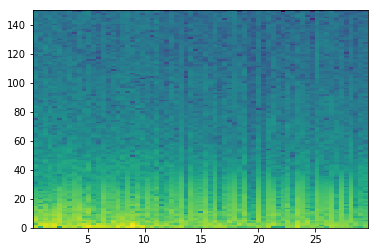

good List
[31, 33, 38, 39, 41, 44, 45, 47, 57, 64, 66]
[2, 5, 1, 2, 3, 1, 2, 10, 7, 2]
the temp 3
[[], [], [3], [], [6], [], [], []]
[38, 39]
longest
[38, 39]
indexList
[38, 39]
theMin
4800
theMax
5100


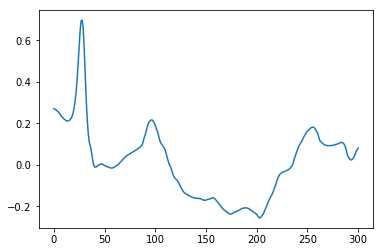

A00932
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

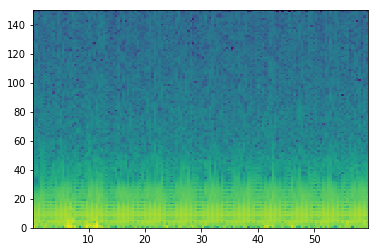

good List
[1, 9]
[8]
the temp 3
[[]]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


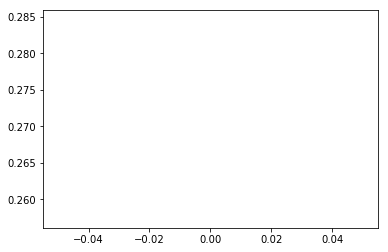

A00933
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


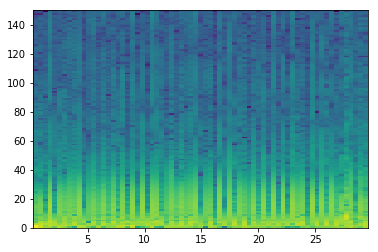

good List
[10, 11, 13, 19, 21, 23, 27, 31, 34, 35, 37, 39, 44, 48, 52, 56]
[1, 2, 6, 2, 2, 4, 4, 3, 1, 2, 2, 5, 4, 4, 4]
the temp 3
[[1], [], [], [], [], [], [], [9], [], [], [], [], []]
[10, 11]
longest
[10, 11]
indexList
[10, 11]
theMin
1200
theMax
1500


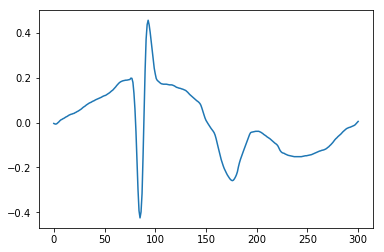

A00939
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


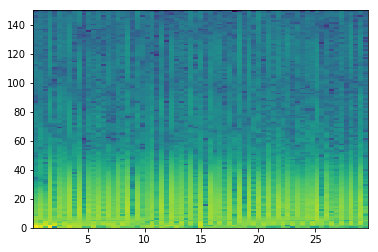

good List
[0, 4, 10, 11, 20, 25, 27, 33, 35, 37, 39, 43, 47, 49, 53, 55, 59, 61, 62, 64, 66, 68]
[4, 6, 1, 9, 5, 2, 6, 2, 2, 2, 4, 4, 2, 4, 2, 4, 2, 1, 2, 2, 2]
the temp 3
[[], [], [3], [], [], [], [], [], [], [], [], [], [], [], [], [], [18], [], []]
[10, 11]
longest
[10, 11]
indexList
[10, 11]
theMin
1200
theMax
1500


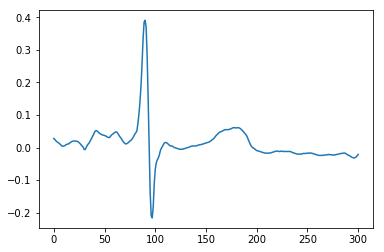

A00951
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


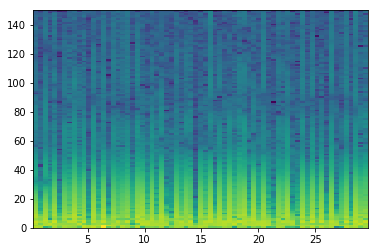

good List
[1, 3, 5, 9, 11, 13, 15, 17, 20, 23, 27, 28, 30, 32, 33, 35, 37, 39, 44, 46, 48, 49, 53, 54, 56, 58, 60, 62, 63, 65]
[2, 2, 4, 2, 2, 2, 2, 3, 3, 4, 1, 2, 2, 1, 2, 2, 2, 5, 2, 2, 1, 4, 1, 2, 2, 2, 2, 1, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [11], [], [14], [], [], [], [], [], [21], [23], [], [], [], [28]]
[27, 28]
longest
[27, 28]
indexList
[27, 28]
theMin
3300
theMax
3600


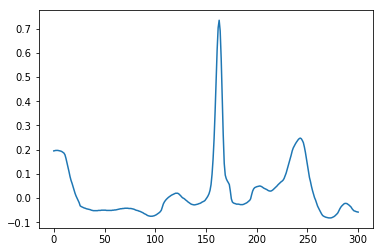

A00954
[ 0.42666667  0.85333333  1.28        1.70666667  2.13333333
  2.56        2.98666667  3.41333333  3.84        4.26666667
  4.69333333  5.12        5.54666667  5.97333333  6.4         6.82666667
  7.25333333  7.68        8.10666667  8.53333333  8.96
  9.38666667  9.81333333]


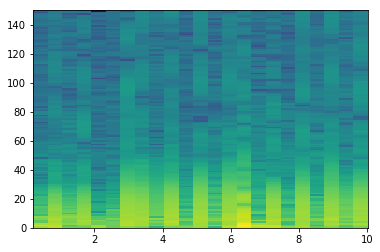

good List
[0, 1, 2, 4, 5, 8, 10, 12, 15, 17, 21]
[1, 1, 2, 1, 3, 2, 2, 3, 2, 4]
the temp 3
[[1, 2], [4], [], [], [], [], []]
[0, 1, 2]
longest
[0, 1, 2]
indexList
[0, 1, 2]
theMin
0
theMax
300


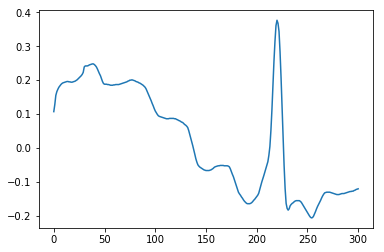

A00964
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


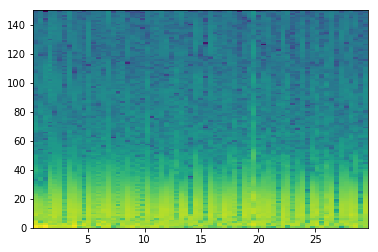

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


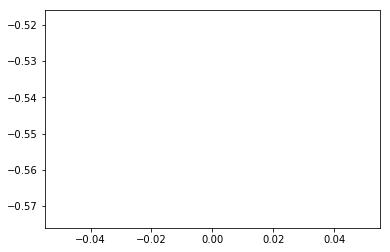

A00972
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

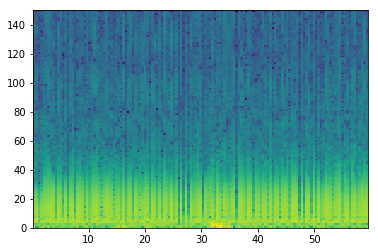

good List
[12, 14, 17, 23, 38, 48, 53, 60, 62, 64, 70, 72, 84, 110, 117]
[2, 3, 6, 15, 10, 5, 7, 2, 2, 6, 2, 12, 26, 7]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


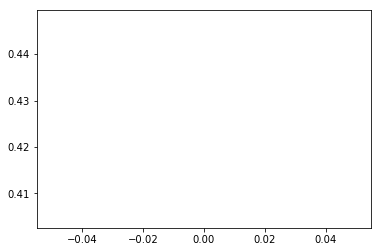

A00974
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


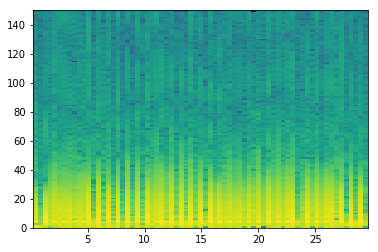

good List
[1, 18, 20, 27, 29, 34, 37, 43, 47, 59, 68]
[17, 2, 7, 2, 5, 3, 6, 4, 12, 9]
the temp 3
[[], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


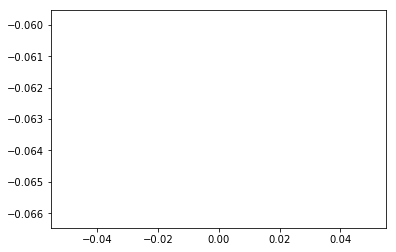

A00982
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


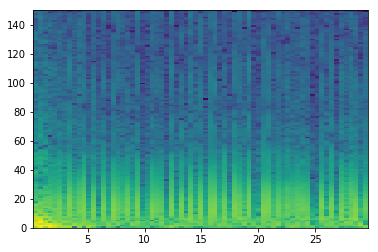

good List
[15, 18, 22, 23, 25, 27, 29, 31, 35, 40, 45, 57, 58, 67]
[3, 4, 1, 2, 2, 2, 2, 4, 5, 5, 12, 1, 9]
the temp 3
[[], [], [3], [], [], [], [], [], [], [], [12]]
[22, 23]
longest
[22, 23]
indexList
[22, 23]
theMin
2700
theMax
3000


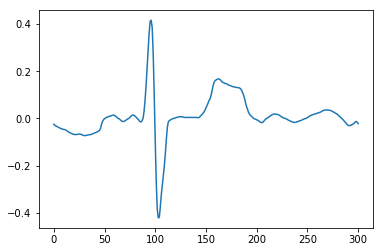

A01005
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24      ]


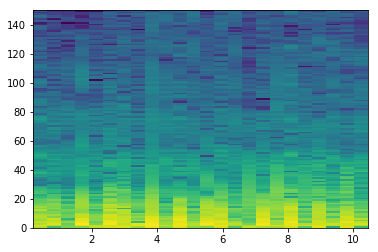

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


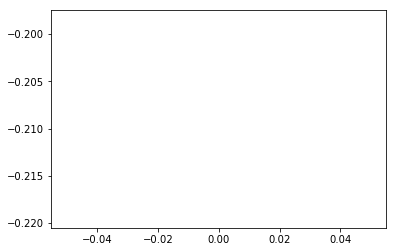

A01013
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


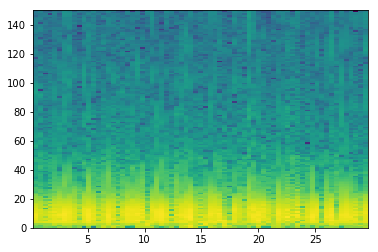

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


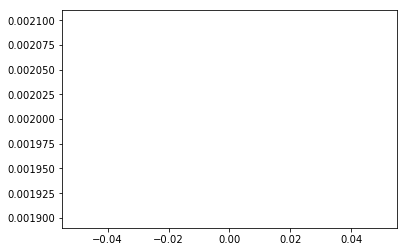

A01019
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


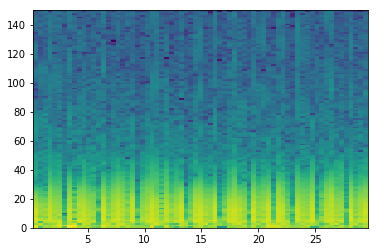

good List
[6, 8, 15, 21, 26, 29, 31, 32, 35, 36, 38, 39, 43, 46, 47, 49, 52, 53, 54, 58, 60, 62]
[2, 7, 6, 5, 3, 2, 1, 3, 1, 2, 1, 4, 3, 1, 2, 3, 1, 1, 4, 2, 2]
the temp 3
[[], [], [], [], [], [], [7], [9], [11], [], [14], [], [17, 18], [], []]
[52, 53, 54]
longest
[52, 53, 54]
indexList
[52, 53, 54]
theMin
6600
theMax
6900


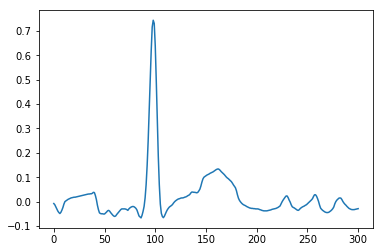

A01024
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

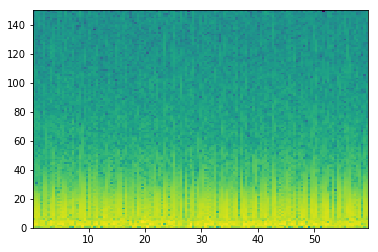

good List
[3, 53, 62, 67, 81, 101, 113, 136]
[50, 9, 5, 14, 20, 12, 23]
the temp 3
[[], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


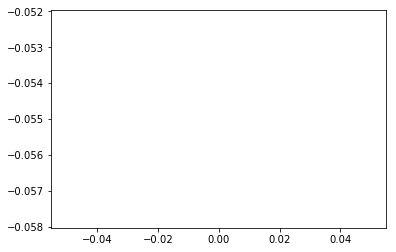

A01029
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

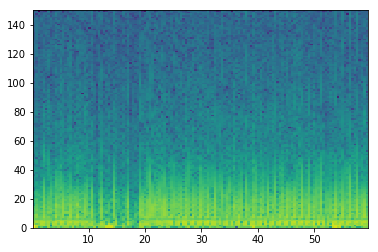

good List
[0, 2, 3, 5, 7, 8, 9, 10, 12, 25, 26, 27, 29, 30, 31, 32, 34, 35, 36, 37, 38, 40, 41, 42, 43, 55, 56, 57, 58, 60, 65, 69, 70, 71, 76, 82, 84, 92, 93, 95, 97, 98, 101, 112, 121, 122, 126, 129]
[2, 1, 2, 2, 1, 1, 1, 2, 13, 1, 1, 2, 1, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 12, 1, 1, 1, 2, 5, 4, 1, 1, 5, 6, 2, 8, 1, 2, 2, 1, 3, 11, 9, 1, 4, 3]
the temp 3
[[], [2], [], [5, 6, 7], [], [10, 11], [13, 14, 15], [17, 18, 19, 20], [22, 23, 24], [26, 27, 28], [], [], [32, 33], [], [], [], [38], [], [41], [], [], [45], []]
[34, 35, 36, 37, 38]
longest
[34, 35, 36, 37, 38]
indexList
[34, 35, 36, 37, 38]
theMin
4200
theMax
4800


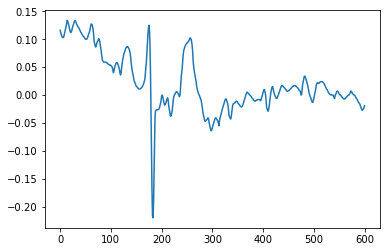

A01041
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


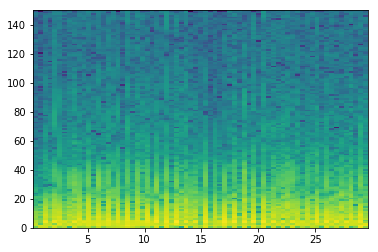

good List
[0, 1, 3, 6, 7, 10, 12, 13, 18, 20, 24, 26, 28, 34, 36, 37, 38, 39, 40, 42, 44, 46, 55, 64, 66, 68]
[1, 2, 3, 1, 3, 2, 1, 5, 2, 4, 2, 2, 6, 2, 1, 1, 1, 1, 2, 2, 2, 9, 9, 2, 2]
the temp 3
[[1], [], [4], [], [7], [], [], [], [], [], [], [15, 16, 17, 18], [], [], [], [], [], []]
[36, 37, 38, 39, 40]
longest
[36, 37, 38, 39, 40]
indexList
[36, 37, 38, 39, 40]
theMin
4500
theMax
5100


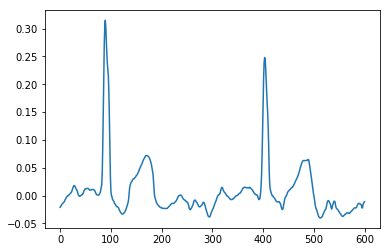

A01042
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


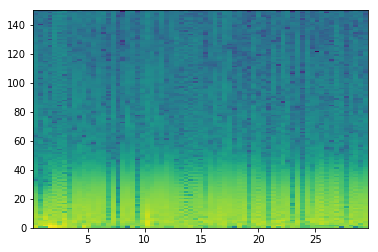

good List
[7, 15, 17, 21, 26, 44, 47, 48, 53, 55, 60, 64]
[8, 2, 4, 5, 18, 3, 1, 5, 2, 5, 4]
the temp 3
[[], [], [], [], [], [], [7], [], [], []]
[47, 48]
longest
[47, 48]
indexList
[47, 48]
theMin
6000
theMax
6300


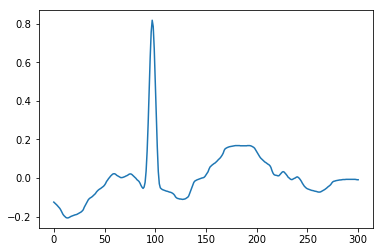

A01045
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


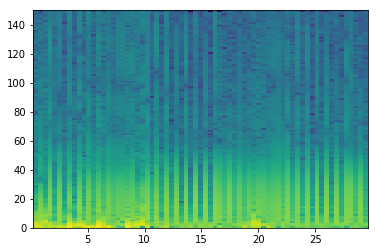

good List
[24, 28, 30, 32, 34, 36, 41, 53, 57, 59, 61, 63, 66, 68]
[4, 2, 2, 2, 2, 5, 12, 4, 2, 2, 2, 3, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


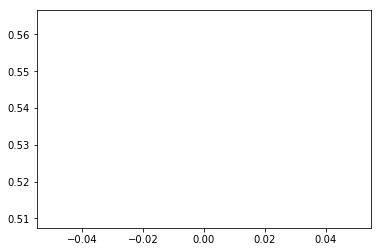

A01052
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


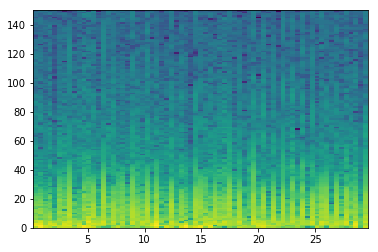

good List
[2, 4, 32, 43, 54, 56, 67]
[2, 28, 11, 11, 2, 11]
the temp 3
[[], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


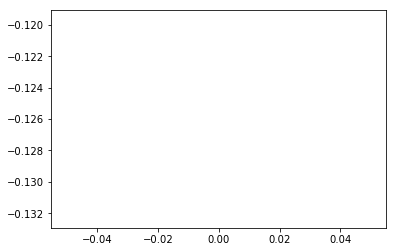

A01056
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667]


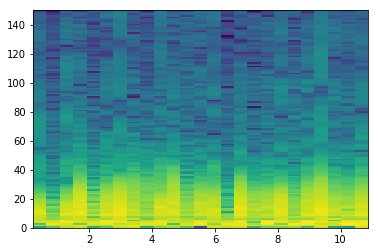

good List
[14, 16]
[2]
the temp 3
[[]]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


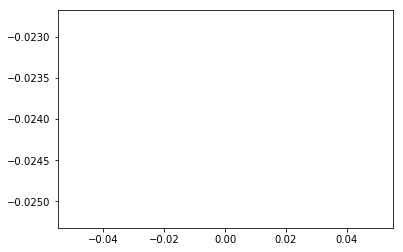

A01075
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


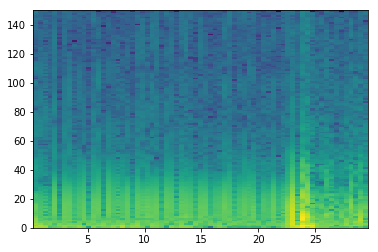

good List
[3, 5, 10, 11, 14, 20, 26, 29, 32, 33, 34, 35, 36, 37, 38, 41, 42, 46, 47, 48, 50]
[2, 5, 1, 3, 6, 6, 3, 3, 1, 1, 1, 1, 1, 1, 3, 1, 4, 1, 1, 2]
the temp 3
[[], [], [3], [], [], [], [], [9, 10, 11, 12, 13, 14], [16], [18, 19]]
[32, 33, 34, 35, 36, 37, 38]
longest
[32, 33, 34, 35, 36, 37, 38]
indexList
[32, 33, 34, 35, 36, 37, 38]
theMin
4200
theMax
4800


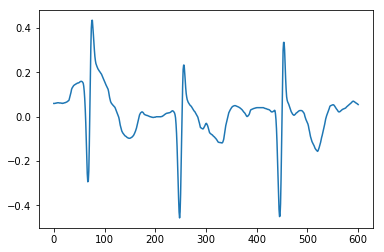

A01076
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52      ]


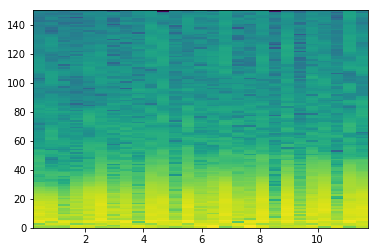

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


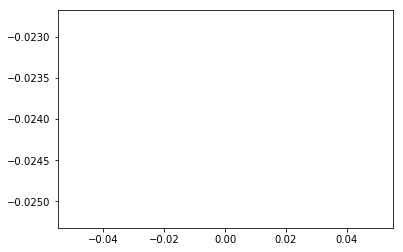

A01079
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


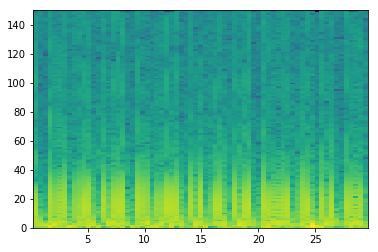

good List
[1, 2, 4, 7, 8, 9, 12, 15, 19, 20, 24, 30, 31, 33, 35, 36, 40, 41, 45, 46, 49, 52, 53, 54, 58, 62, 63, 65, 68]
[1, 2, 3, 1, 1, 3, 3, 4, 1, 4, 6, 1, 2, 2, 1, 4, 1, 4, 1, 3, 3, 1, 1, 4, 4, 1, 2, 3]
the temp 3
[[1], [], [4, 5], [], [], [9], [], [12], [], [15], [17], [19], [], [22, 23], [], [26], []]
[7, 8, 9]
longest
[7, 8, 9]
indexList
[7, 8, 9]
theMin
900
theMax
1200


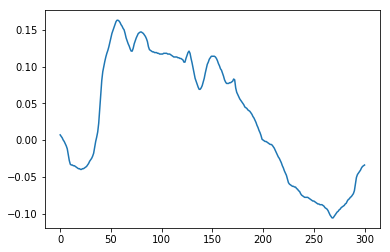

A01087
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

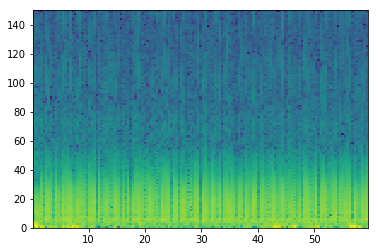

good List
[26, 40, 60, 69, 72, 78, 83, 84, 85, 86, 96, 105, 122, 126, 132, 134, 137]
[14, 20, 9, 3, 6, 5, 1, 1, 1, 10, 9, 17, 4, 6, 2, 3]
the temp 3
[[], [], [], [], [], [], [7, 8, 9], [], [], [], [], [], []]
[83, 84, 85, 86]
longest
[83, 84, 85, 86]
indexList
[83, 84, 85, 86]
theMin
10500
theMax
11100


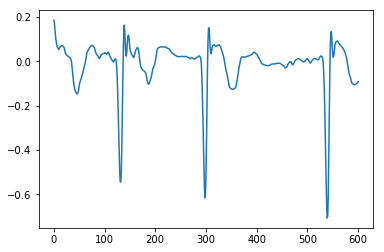

A01092
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

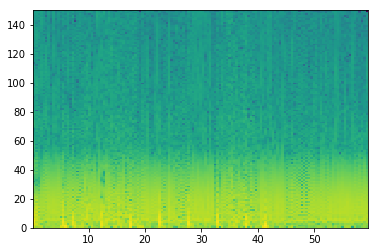

good List
[75, 106]
[31]
the temp 3
[[]]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


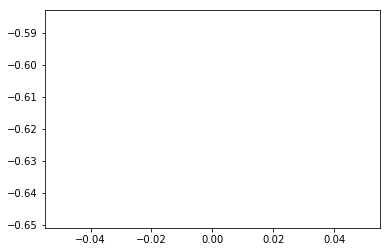

A01104
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


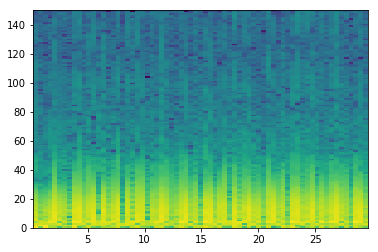

good List
[2, 5, 32, 38, 47, 59, 60]
[3, 27, 6, 9, 12, 1]
the temp 3
[[], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


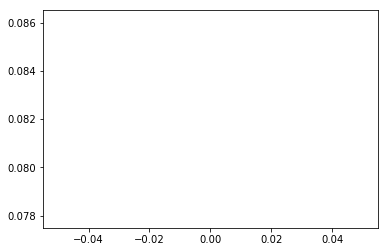

A01129
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


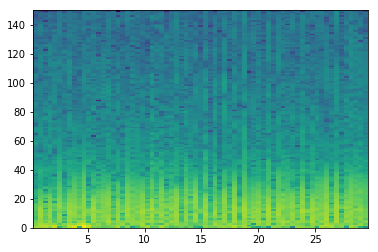

good List
[38]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


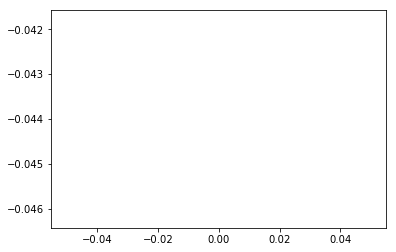

A01153
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


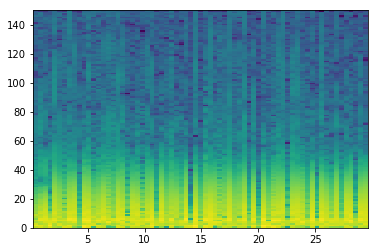

good List
[0, 9, 20, 22, 24, 25, 27, 29, 30, 32, 34, 41, 44, 46, 48, 52, 56, 58, 60, 61, 64, 66, 68]
[9, 11, 2, 2, 1, 2, 2, 1, 2, 2, 7, 3, 2, 2, 4, 4, 2, 2, 1, 3, 2, 2]
the temp 3
[[], [], [], [], [5], [], [8], [], [], [], [], [], [], [], [], [], [19], [], []]
[24, 25]
longest
[24, 25]
indexList
[24, 25]
theMin
3000
theMax
3300


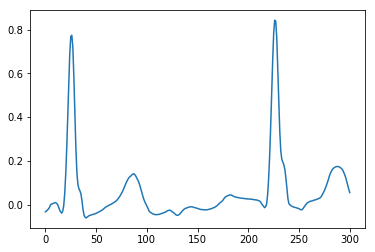

A01163
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


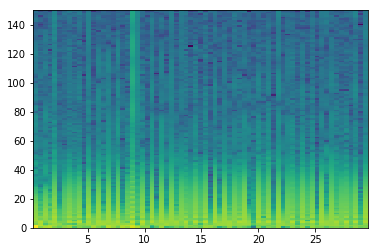

good List
[1, 3, 5, 6, 8, 9, 10, 12, 14, 16, 18, 19, 23, 25, 27, 32, 34, 35, 36, 37, 38, 40, 41, 44, 45, 49, 51, 52, 54, 56, 58, 63, 65, 66, 67]
[2, 2, 1, 2, 1, 1, 2, 2, 2, 2, 1, 4, 2, 2, 5, 2, 1, 1, 1, 1, 2, 1, 3, 1, 4, 2, 1, 2, 2, 2, 5, 2, 1, 1]
the temp 3
[[], [], [3], [5, 6], [], [], [], [11], [], [], [], [], [17, 18, 19, 20], [22], [24], [], [27], [], [], [], []]
[34, 35, 36, 37, 38]
longest
[34, 35, 36, 37, 38]
indexList
[34, 35, 36, 37, 38]
theMin
4200
theMax
4800


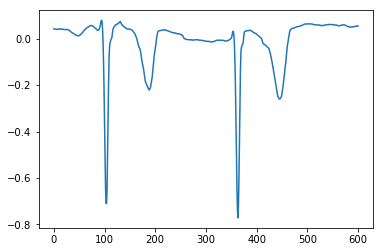

A01171
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


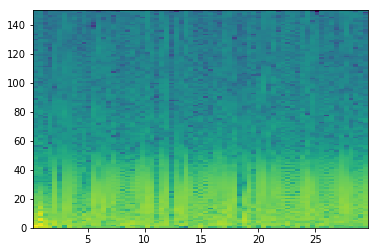

good List
[28]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


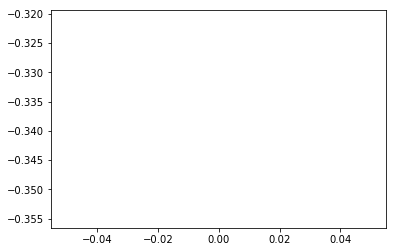

A01192
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333]


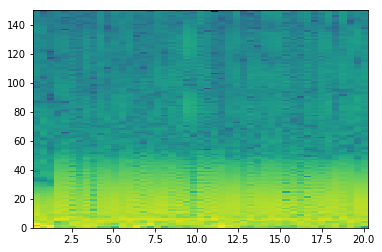

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


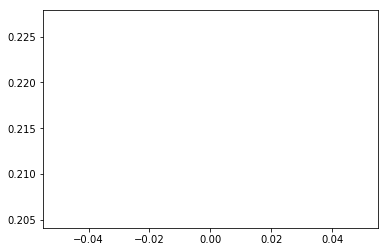

A01198
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

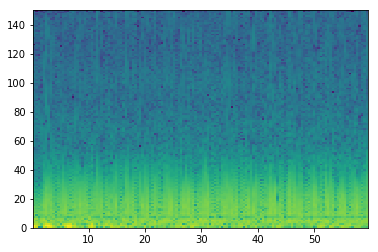

good List
[1, 19, 21, 27, 28, 29, 35, 38, 40, 51, 132]
[18, 2, 6, 1, 1, 6, 3, 2, 11, 81]
the temp 3
[[], [], [], [4, 5], [], [], [], []]
[27, 28, 29]
longest
[27, 28, 29]
indexList
[27, 28, 29]
theMin
3300
theMax
3600


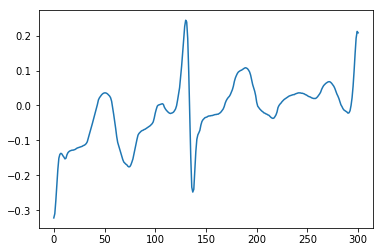

A01210
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

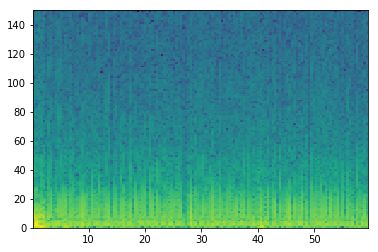

good List
[5, 8, 17, 24, 32, 35, 58, 62, 63, 69, 72, 76, 79, 90, 92, 98, 101, 114, 118, 126, 128, 129, 132, 133]
[3, 9, 7, 8, 3, 23, 4, 1, 6, 3, 4, 3, 11, 2, 6, 3, 13, 4, 8, 2, 1, 3, 1]
the temp 3
[[], [], [], [], [], [], [], [8], [], [], [], [], [], [], [], [], [], [], [], [21]]
[62, 63]
longest
[62, 63]
indexList
[62, 63]
theMin
7800
theMax
8100


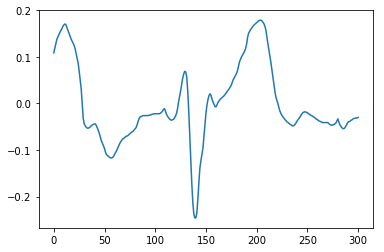

A01217
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


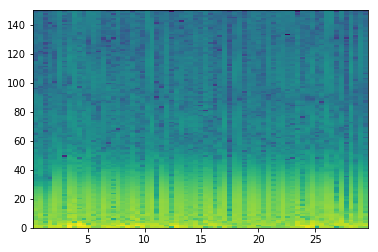

good List
[2, 22, 40, 47, 64, 68]
[20, 18, 7, 17, 4]
the temp 3
[[], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


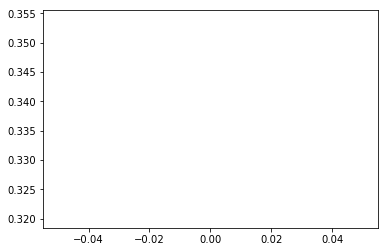

A01230
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


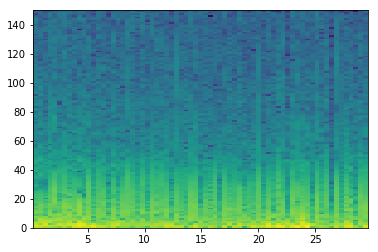

good List
[36, 39, 41, 47, 61]
[3, 2, 6, 14]
the temp 3
[[], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


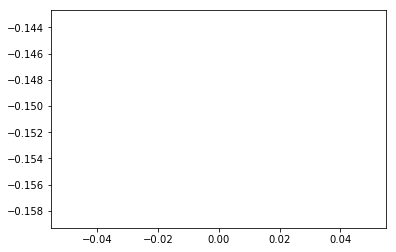

A01240
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


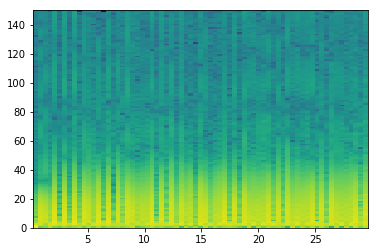

good List
[0, 5, 7, 9, 25, 29, 31, 33, 35, 36, 37, 40, 42, 49, 51, 53, 55, 57, 60]
[5, 2, 2, 16, 4, 2, 2, 2, 1, 1, 3, 2, 7, 2, 2, 2, 2, 3]
the temp 3
[[], [], [], [], [], [], [], [], [9, 10], [], [], [], [], [], [], []]
[35, 36, 37]
longest
[35, 36, 37]
indexList
[35, 36, 37]
theMin
4500
theMax
4800


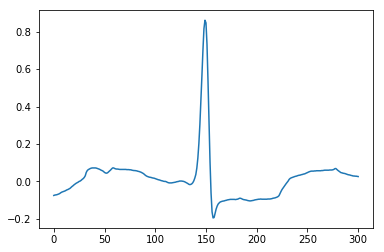

A01244
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


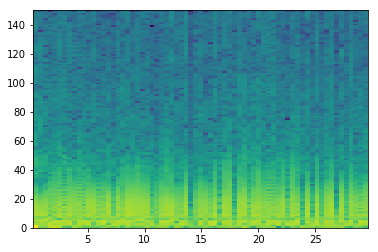

good List
[7, 32, 33, 55, 57, 59, 62, 64, 66]
[25, 1, 22, 2, 2, 3, 2, 2]
the temp 3
[[], [2], [], [], [], [], []]
[32, 33]
longest
[32, 33]
indexList
[32, 33]
theMin
4200
theMax
4500


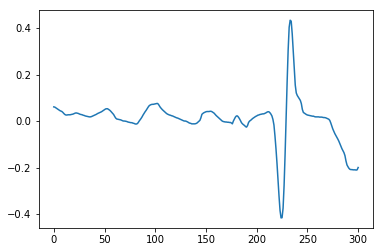

A01258
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333]


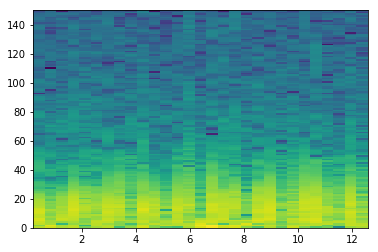

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


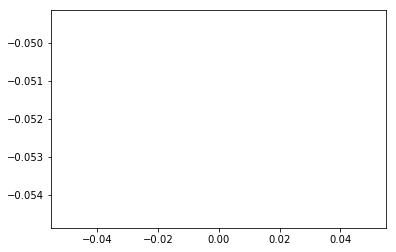

A01259
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


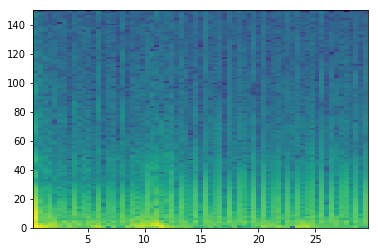

good List
[6, 7, 12, 14, 17, 19, 32, 34, 36, 39, 41, 44, 46, 48, 49, 51, 55, 58, 60, 65, 67]
[1, 5, 2, 3, 2, 13, 2, 2, 3, 2, 3, 2, 2, 1, 2, 4, 3, 2, 5, 2]
the temp 3
[[1], [], [], [], [], [], [], [], [], [], [], [], [14], [], [], [], [], []]
[6, 7]
longest
[6, 7]
indexList
[6, 7]
theMin
600
theMax
900


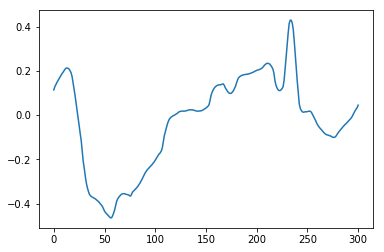

A01267
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


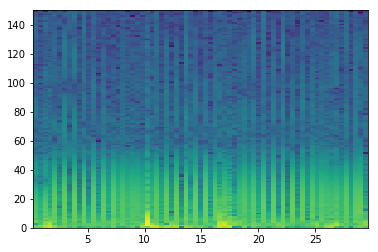

good List
[0, 1, 9, 13, 15, 17, 26, 28, 30, 34, 36, 46, 48, 50, 52, 54, 56, 63, 65, 68]
[1, 8, 4, 2, 2, 9, 2, 2, 4, 2, 10, 2, 2, 2, 2, 2, 7, 2, 3]
the temp 3
[[1], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[0, 1]
longest
[0, 1]
indexList
[0, 1]
theMin
0
theMax
300


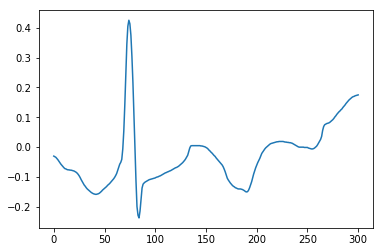

A01268
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

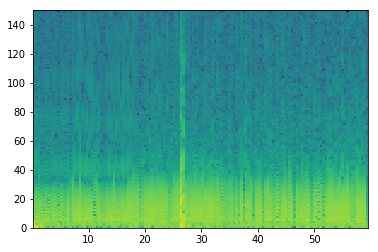

good List
[3, 10, 28, 29, 35, 83]
[7, 18, 1, 6, 48]
the temp 3
[[], [], [3], []]
[28, 29]
longest
[28, 29]
indexList
[28, 29]
theMin
3600
theMax
3900


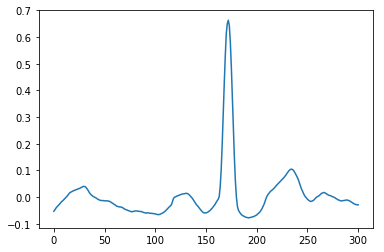

A01290
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


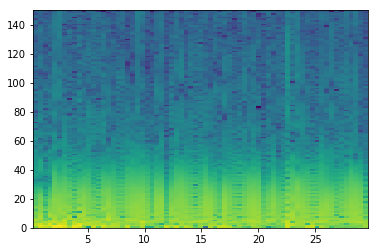

good List
[27, 50, 68]
[23, 18]
the temp 3
[[], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


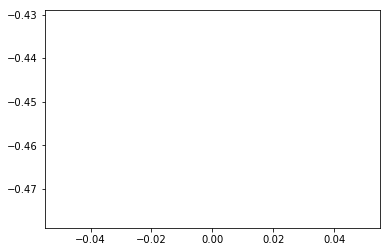

A01301
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


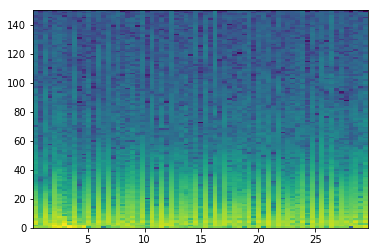

good List
[1, 3, 7, 9, 10, 12, 14, 16, 21, 23, 27, 28, 32, 34, 36, 43, 44, 45, 49, 51, 56, 58]
[2, 4, 2, 1, 2, 2, 2, 5, 2, 4, 1, 4, 2, 2, 7, 1, 1, 4, 2, 5, 2]
the temp 3
[[], [], [], [4], [], [], [], [], [], [11], [], [], [], [16, 17], [], [], []]
[43, 44, 45]
longest
[43, 44, 45]
indexList
[43, 44, 45]
theMin
5400
theMax
5700


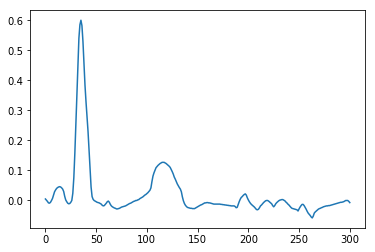

A01302
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

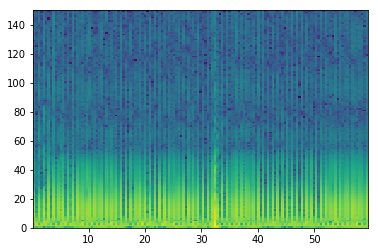

good List
[1, 3, 5, 7, 8, 9, 10, 13, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35, 37, 39, 41, 42, 43, 44, 45, 47, 49, 51, 52, 53, 54, 55, 57, 59, 60, 61, 62, 63, 65, 67, 68, 69, 70, 71, 73, 77, 78, 79, 80, 81, 82, 83, 85, 87, 88, 89, 90, 91, 92, 93, 94, 96, 97, 98, 99, 100, 102, 104, 106, 108, 110, 112, 114, 116, 118, 119, 120, 121, 122, 123, 124, 126, 128, 129, 130, 131, 133, 134, 135, 136, 137, 138]
[2, 2, 2, 1, 1, 1, 3, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 2, 4, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 2, 1, 1, 1, 1, 1]
the temp 3
[[], [], [], [4, 5, 6], [], [9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22], [24, 25, 26, 27], [], [], [31, 32, 33, 34], [], [], [38, 39, 40, 41], [], [44, 45, 46, 47], [], [50, 51, 52, 53], [], [56, 57, 58, 59, 60, 61], [], [64, 65, 66,

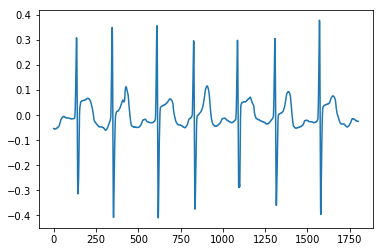

A01303
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


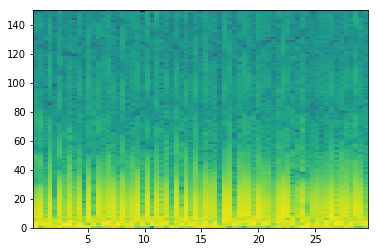

good List
[2, 4, 6, 8, 10, 11, 12, 13, 14, 16, 17, 19, 21, 22, 24, 28, 32, 34, 36, 37, 38, 41, 45, 47, 48, 49, 51, 56, 57, 58, 59, 60, 62, 68]
[2, 2, 2, 2, 1, 1, 1, 1, 2, 1, 2, 2, 1, 2, 4, 4, 2, 2, 1, 1, 3, 4, 2, 1, 1, 2, 5, 1, 1, 1, 1, 2, 6]
the temp 3
[[], [], [], [], [5, 6, 7, 8], [10], [], [13], [], [], [], [], [19, 20], [], [], [24, 25], [], [28, 29, 30, 31], []]
[10, 11, 12, 13, 14]
longest
[10, 11, 12, 13, 14]
indexList
[10, 11, 12, 13, 14]
theMin
1200
theMax
1800


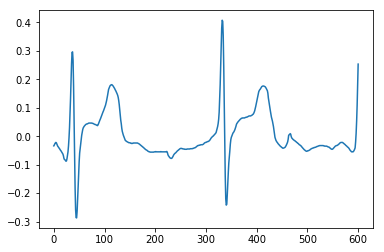

A01309
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


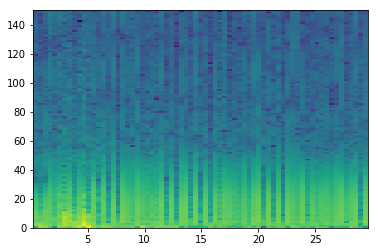

good List
[17, 29, 36, 44, 49, 51, 56, 57, 58, 59, 64]
[12, 7, 8, 5, 2, 5, 1, 1, 1, 5]
the temp 3
[[], [], [], [], [], [], [7, 8, 9]]
[56, 57, 58, 59]
longest
[56, 57, 58, 59]
indexList
[56, 57, 58, 59]
theMin
7200
theMax
7500


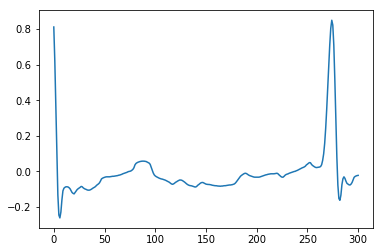

A01313
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


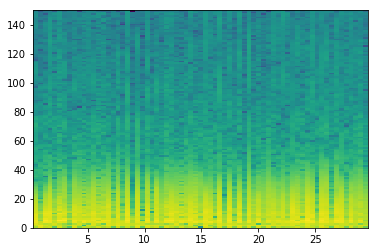

good List
[20, 43]
[23]
the temp 3
[[]]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


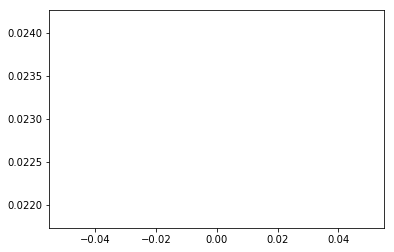

A01324
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


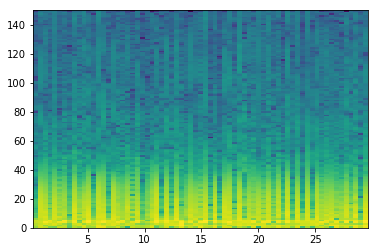

good List
[23, 46, 53, 55]
[23, 7, 2]
the temp 3
[[], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


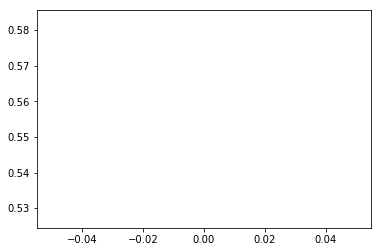

A01325
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


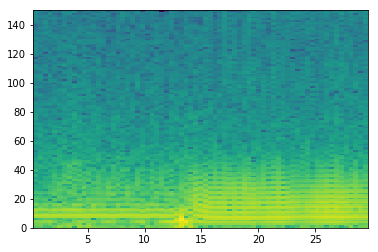

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


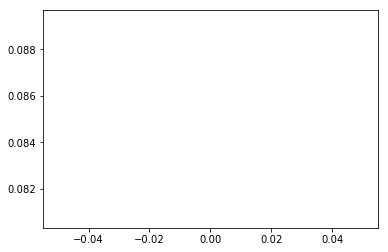

A01326
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

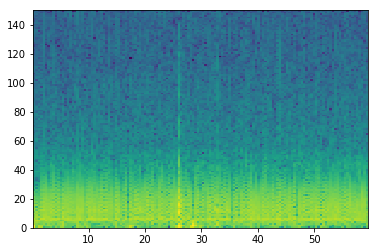

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


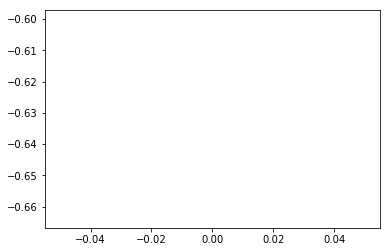

A01342
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


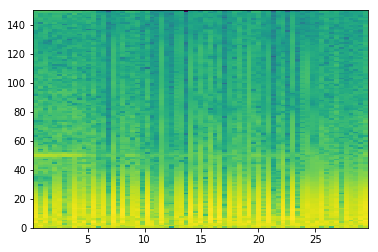

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


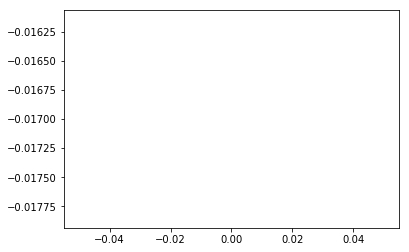

A01355
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


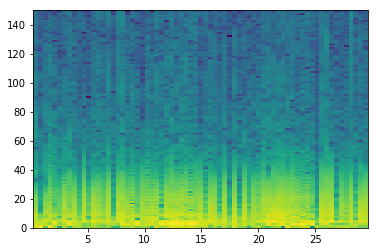

good List
[1, 5, 9, 11, 14, 16, 22, 38, 40, 42, 45, 58, 68]
[4, 4, 2, 3, 2, 6, 16, 2, 2, 3, 13, 10]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


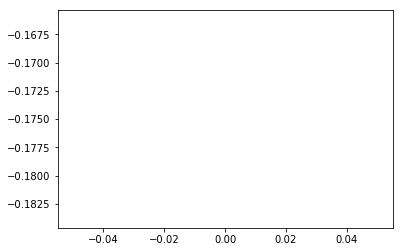

A01363
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


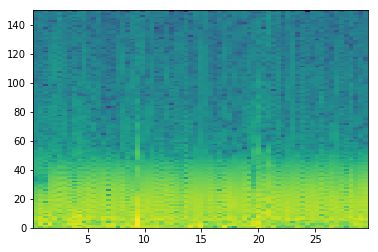

good List
[40]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


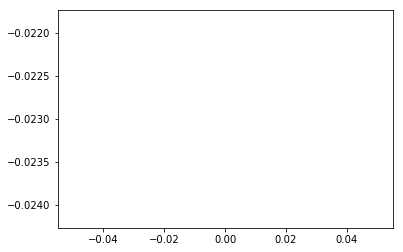

A01370
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


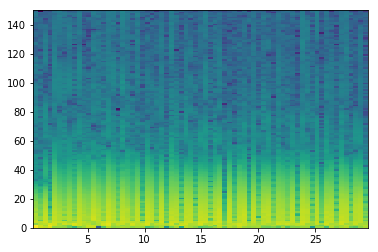

good List
[1, 3, 22, 30, 39, 44, 46, 49, 59, 64, 65, 68]
[2, 19, 8, 9, 5, 2, 3, 10, 5, 1, 3]
the temp 3
[[], [], [], [], [], [], [], [], [], [10]]
[64, 65]
longest
[64, 65]
indexList
[64, 65]
theMin
8100
theMax
8400


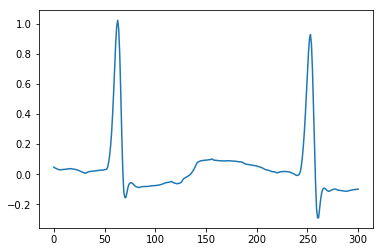

A01371
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

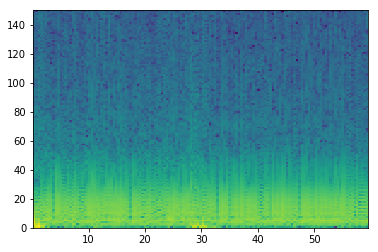

good List
[40, 72, 81, 82, 85, 90, 110, 116, 119, 124, 133]
[32, 9, 1, 3, 5, 20, 6, 3, 5, 9]
the temp 3
[[], [], [3], [], [], [], [], [], []]
[81, 82]
longest
[81, 82]
indexList
[81, 82]
theMin
10200
theMax
10500


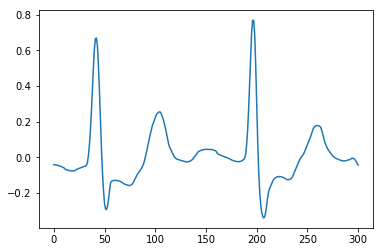

A01376
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


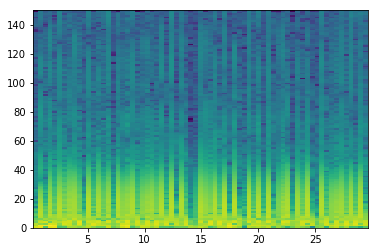

good List
[0, 2, 10, 12, 16, 18, 22, 27, 32, 33, 40, 42, 43, 45, 47, 49, 50, 53, 55, 57, 58, 61]
[2, 8, 2, 4, 2, 4, 5, 5, 1, 7, 2, 1, 2, 2, 2, 1, 3, 2, 2, 1, 3]
the temp 3
[[], [], [], [], [], [], [], [], [9], [], [12], [], [], [16], [], [], [20]]
[32, 33]
longest
[32, 33]
indexList
[32, 33]
theMin
4200
theMax
4500


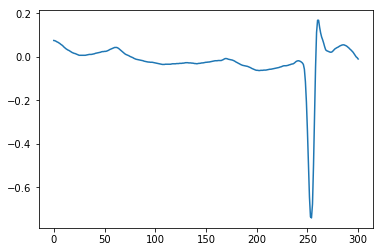

A01383
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


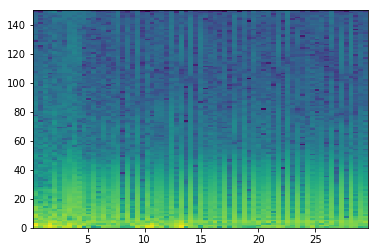

good List
[13, 15, 18, 20, 22, 27, 29, 31, 33, 35, 40, 42, 44, 49, 51, 53, 55, 58, 60, 62, 64, 66]
[2, 3, 2, 2, 5, 2, 2, 2, 2, 5, 2, 2, 5, 2, 2, 2, 3, 2, 2, 2, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


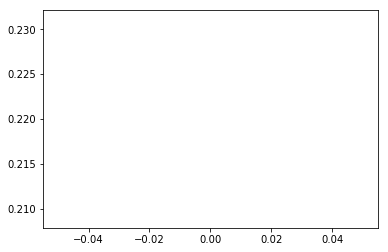

A01386
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


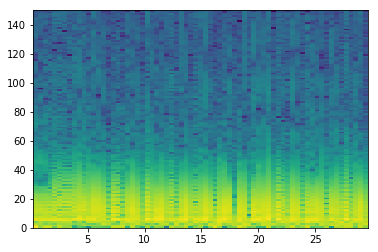

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


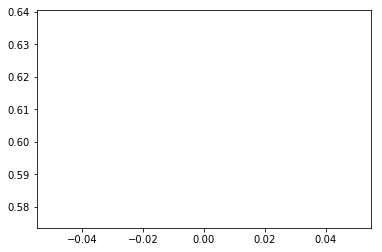

A01395
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


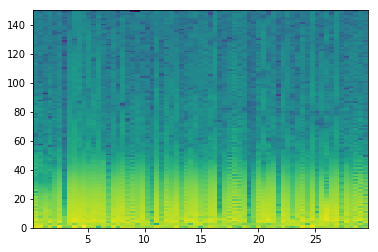

good List
[2, 6, 15, 16, 19, 23, 24, 26, 28, 30, 31, 34, 38, 43, 44, 45, 49, 50, 53, 58, 63, 64, 68]
[4, 9, 1, 3, 4, 1, 2, 2, 2, 1, 3, 4, 5, 1, 1, 4, 1, 3, 5, 5, 1, 4]
the temp 3
[[], [], [3], [], [6], [], [], [10], [], [], [14, 15], [17], [], [], [21]]
[43, 44, 45]
longest
[43, 44, 45]
indexList
[43, 44, 45]
theMin
5400
theMax
5700


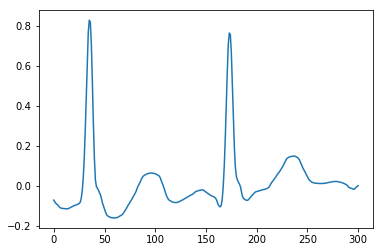

A01405
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667]


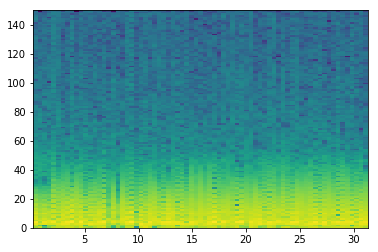

good List
[27, 29, 69]
[2, 40]
the temp 3
[[], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


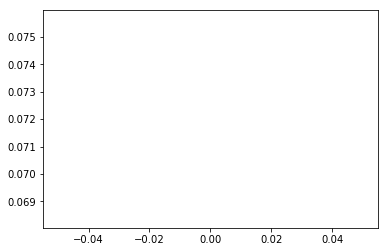

A01420
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


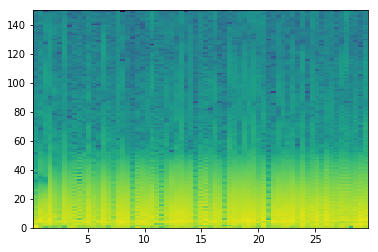

good List
[20, 31, 33, 39, 48]
[11, 2, 6, 9]
the temp 3
[[], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


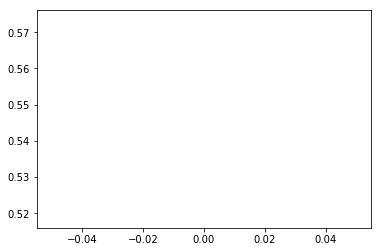

A01433
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


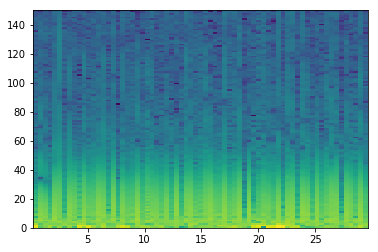

good List
[2, 8, 9, 15, 17, 22, 30, 43, 51, 54, 57, 63, 68]
[6, 1, 6, 2, 5, 8, 13, 8, 3, 3, 6, 5]
the temp 3
[[], [2], [], [], [], [], [], [], [], [], []]
[8, 9]
longest
[8, 9]
indexList
[8, 9]
theMin
900
theMax
1200


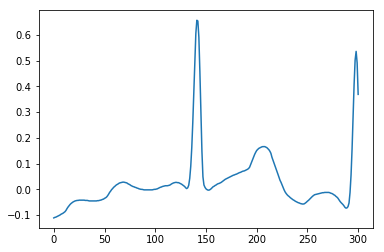

A01443
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


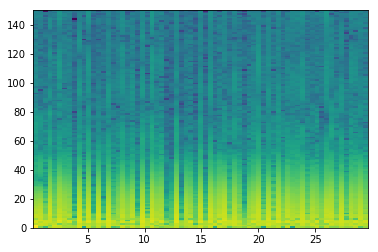

good List
[4, 8, 10, 12, 14, 19, 21, 23, 27, 28, 30, 33, 35, 43, 57, 59, 64]
[4, 2, 2, 2, 5, 2, 2, 4, 1, 2, 3, 2, 8, 14, 2, 5]
the temp 3
[[], [], [], [], [], [], [], [], [9], [], [], [], [], [], []]
[27, 28]
longest
[27, 28]
indexList
[27, 28]
theMin
3300
theMax
3600


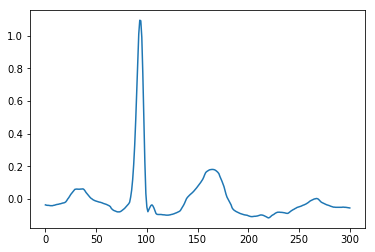

A01449
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


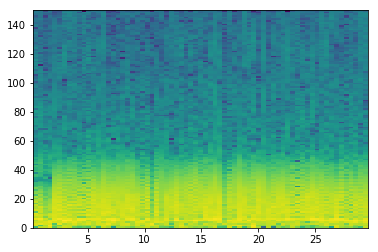

good List
[24, 29]
[5]
the temp 3
[[]]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


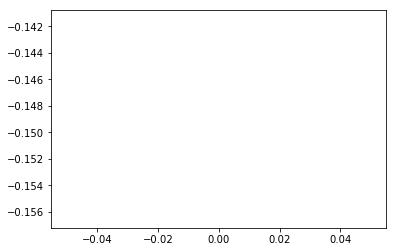

A01450
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


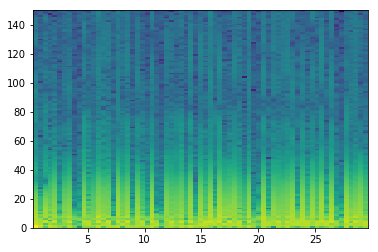

good List
[1, 5, 6, 8, 9, 12, 16, 20, 22, 23, 25, 26, 31, 33, 35, 37, 39, 43, 45, 46, 48, 51, 54, 56, 58, 60, 62, 63, 65, 68]
[4, 1, 2, 1, 3, 4, 4, 2, 1, 2, 1, 5, 2, 2, 2, 2, 4, 2, 1, 2, 3, 3, 2, 2, 2, 2, 1, 2, 3]
the temp 3
[[], [2], [4], [], [], [], [9], [11], [], [], [], [], [], [], [19], [], [], [], [], [], [], [27], []]
[5, 6]
longest
[5, 6]
indexList
[5, 6]
theMin
600
theMax
900


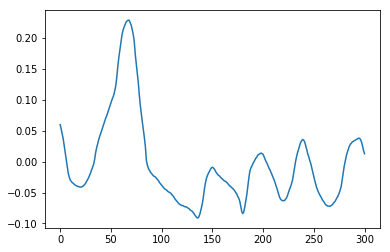

A01467
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

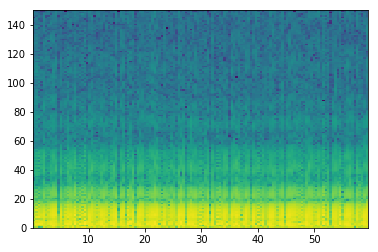

good List
[10, 12, 18, 35, 38, 63, 73, 90, 104, 123, 133]
[2, 6, 17, 3, 25, 10, 17, 14, 19, 10]
the temp 3
[[], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


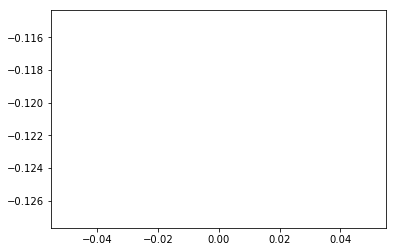

A01491
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


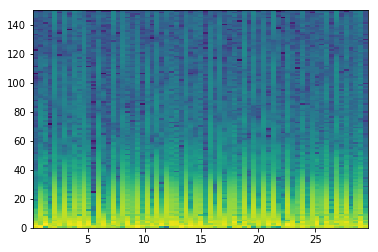

good List
[0, 3, 5, 7, 11, 12, 14, 15, 17, 20, 22, 24, 26, 30, 35, 37, 40, 42, 44, 46, 51, 53, 54, 56, 61, 65, 66, 68]
[3, 2, 2, 4, 1, 2, 1, 2, 3, 2, 2, 2, 4, 5, 2, 3, 2, 2, 2, 5, 2, 1, 2, 5, 4, 1, 2]
the temp 3
[[], [], [], [], [5], [7], [], [], [], [], [], [], [], [], [], [], [], [], [], [22], [], [], [26]]
[11, 12]
longest
[11, 12]
indexList
[11, 12]
theMin
1500
theMax
1800


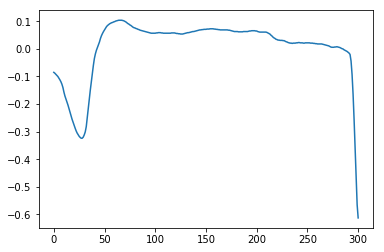

A01501
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


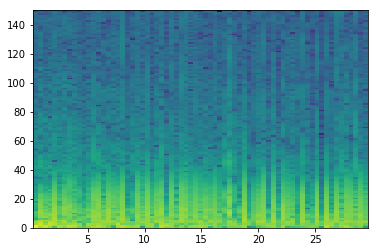

good List
[24, 29, 33, 37, 38, 44, 45, 48, 52, 53, 54, 56, 57, 59, 61, 65, 68]
[5, 4, 4, 1, 6, 1, 3, 4, 1, 1, 2, 1, 2, 2, 4, 3]
the temp 3
[[], [], [], [4], [6], [], [9, 10], [12], [], [], []]
[52, 53, 54]
longest
[52, 53, 54]
indexList
[52, 53, 54]
theMin
6600
theMax
6900


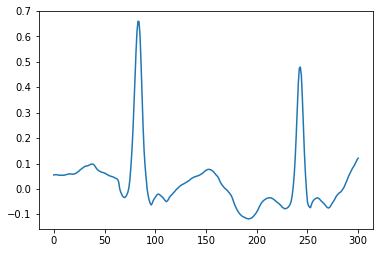

A01511
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667]


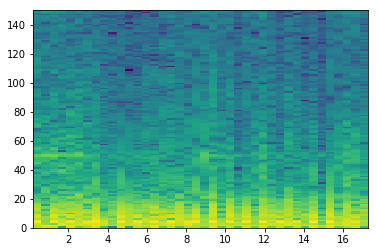

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


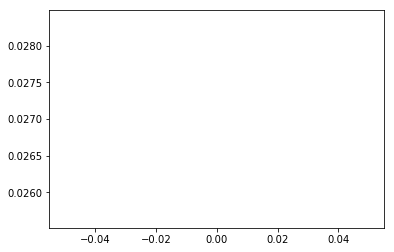

A01519
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


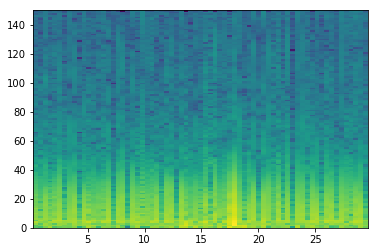

good List
[16, 53]
[37]
the temp 3
[[]]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


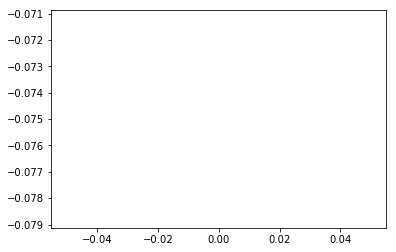

A01522
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

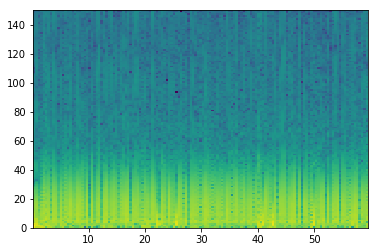

good List
[2, 16, 25, 55, 80, 111, 121, 123]
[14, 9, 30, 25, 31, 10, 2]
the temp 3
[[], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


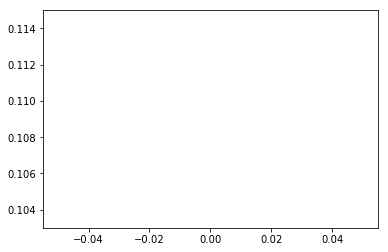

A01550
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

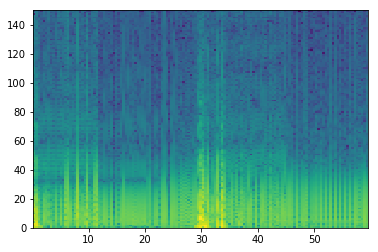

good List
[27, 28, 31, 33, 34, 35, 44, 49, 52, 56, 106, 107, 108, 110, 114, 115, 116, 118, 120, 121, 122, 124, 126, 128, 129, 130, 132, 134]
[1, 3, 2, 1, 1, 9, 5, 3, 4, 50, 1, 1, 2, 4, 1, 1, 2, 2, 1, 1, 2, 2, 2, 1, 1, 2, 2]
the temp 3
[[1], [], [4, 5], [], [], [], [], [11, 12], [], [15, 16], [], [19, 20], [], [], [24, 25], []]
[33, 34, 35]
longest
[33, 34, 35]
indexList
[33, 34, 35]
theMin
4200
theMax
4500


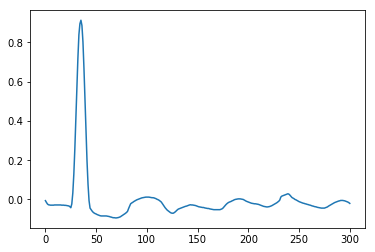

A01562
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


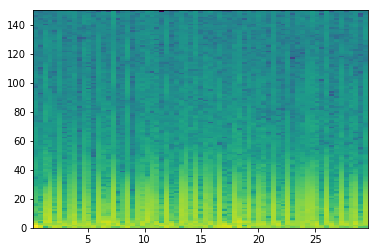

good List
[0, 1, 4, 6, 9, 12, 17, 18, 20, 21, 26, 28, 29, 34, 37, 39, 43, 45, 46, 48, 50, 51, 53, 54, 59, 61, 64, 67]
[1, 3, 2, 3, 3, 5, 1, 2, 1, 5, 2, 1, 5, 3, 2, 4, 2, 1, 2, 2, 1, 2, 1, 5, 2, 3, 3]
the temp 3
[[1], [], [], [], [], [7], [9], [], [12], [], [], [], [], [18], [], [21], [23], [], [], []]
[0, 1]
longest
[0, 1]
indexList
[0, 1]
theMin
0
theMax
300


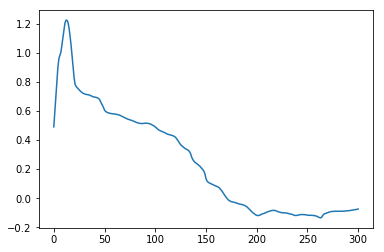

A01584
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


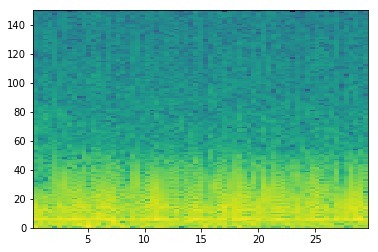

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


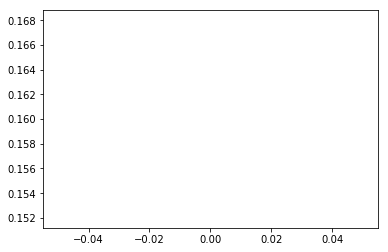

A01589
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

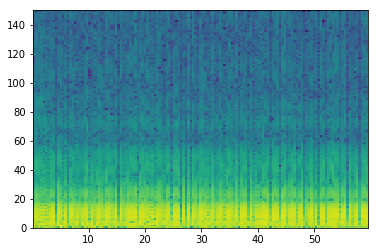

good List
[9, 14, 23, 35, 57, 61, 63, 65, 75, 78, 85, 98, 102, 105, 112, 116, 118, 121, 130, 135]
[5, 9, 12, 22, 4, 2, 2, 10, 3, 7, 13, 4, 3, 7, 4, 2, 3, 9, 5]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


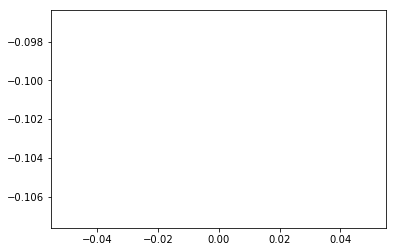

A01594
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333]


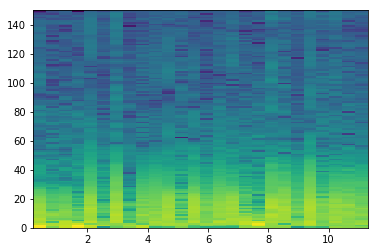

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


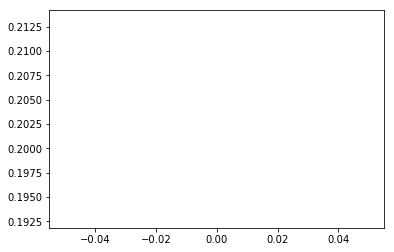

A01607
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667]


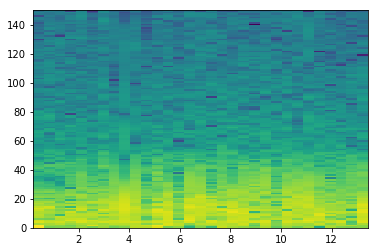

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


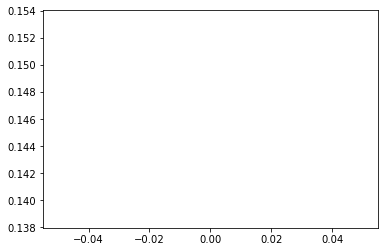

A01618
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667]


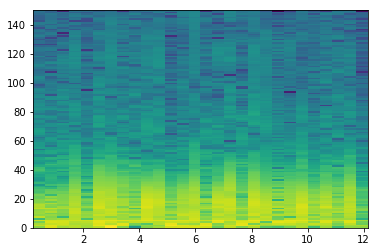

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


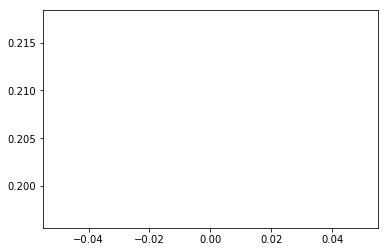

A01624
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


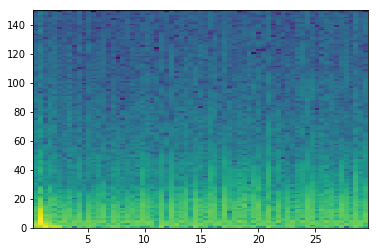

good List
[5, 6, 10, 15, 41, 45, 51, 53, 60]
[1, 4, 5, 26, 4, 6, 2, 7]
the temp 3
[[1], [], [], [], [], [], []]
[5, 6]
longest
[5, 6]
indexList
[5, 6]
theMin
600
theMax
900


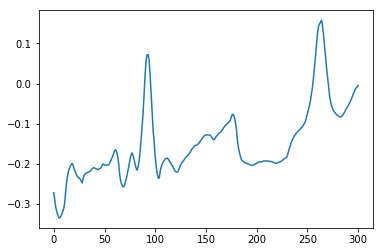

A01629
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333]


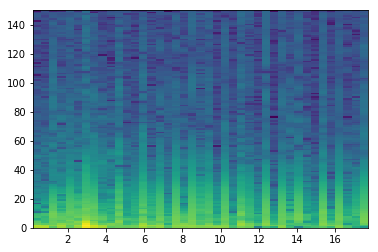

good List
[0, 12, 14, 16, 18, 22, 24, 26, 27, 29, 31, 33, 34, 36, 38, 39]
[12, 2, 2, 2, 4, 2, 2, 1, 2, 2, 2, 1, 2, 2, 1]
the temp 3
[[], [], [], [], [], [], [], [8], [], [], [12], []]
[26, 27]
longest
[26, 27]
indexList
[26, 27]
theMin
3300
theMax
3600


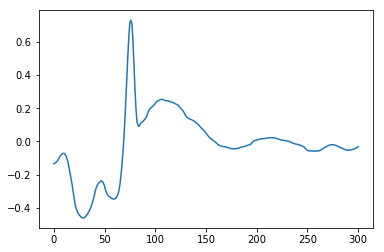

A01642
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


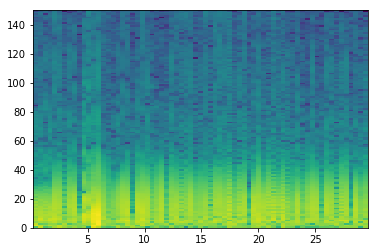

good List
[9, 16, 20, 59, 65]
[7, 4, 39, 6]
the temp 3
[[], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


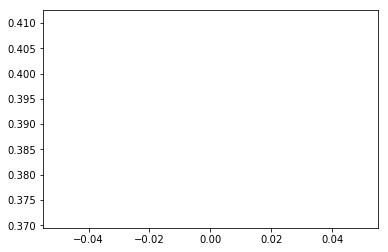

A01662
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


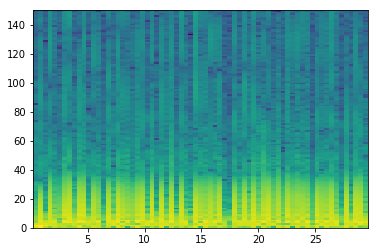

good List
[2, 5, 8, 11, 14, 16, 20, 25, 29, 32, 39, 40, 42, 51, 55, 57, 63, 65]
[3, 3, 3, 3, 2, 4, 5, 4, 3, 7, 1, 2, 9, 4, 2, 6, 2]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [11], [], [], [], [], []]
[39, 40]
longest
[39, 40]
indexList
[39, 40]
theMin
5100
theMax
5400


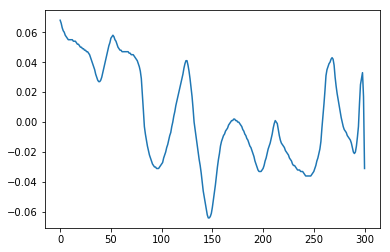

A01685
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

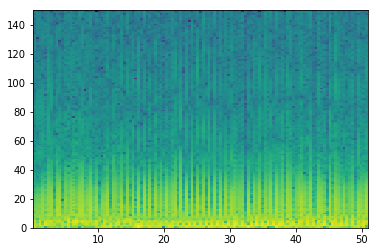

good List
[0, 4, 7, 10, 11, 13, 18, 21, 22, 23, 24, 27, 32, 34, 36, 38, 40, 42, 44, 45, 47, 48, 51, 53, 55, 57, 59, 61, 63, 65, 67, 69, 72, 75, 76, 77, 81, 89, 92, 93, 99, 100, 102, 103, 104, 108, 111, 112, 114]
[4, 3, 3, 1, 2, 5, 3, 1, 1, 1, 3, 5, 2, 2, 2, 2, 2, 2, 1, 2, 1, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 1, 1, 4, 8, 3, 1, 6, 1, 2, 1, 1, 4, 3, 1, 2]
the temp 3
[[], [], [], [4], [], [], [8, 9, 10], [], [], [], [], [], [], [], [19], [21], [], [], [], [], [], [], [], [], [], [], [], [34, 35], [], [], [39], [41], [43, 44], [], [47]]
[21, 22, 23, 24]
longest
[21, 22, 23, 24]
indexList
[21, 22, 23, 24]
theMin
2700
theMax
3000


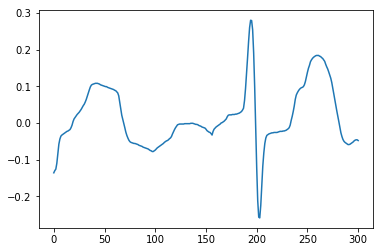

A01691
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


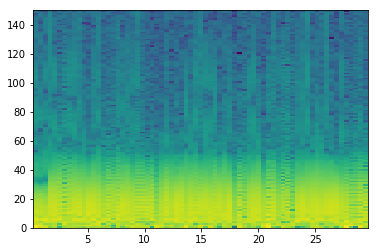

good List
[25, 41, 47, 62]
[16, 6, 15]
the temp 3
[[], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


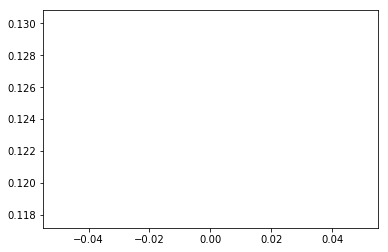

A01693
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


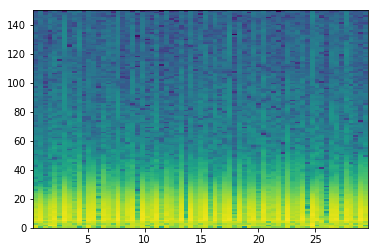

good List
[2, 12, 13, 23, 24, 31, 33, 41, 56, 60, 66]
[10, 1, 10, 1, 7, 2, 8, 15, 4, 6]
the temp 3
[[], [2], [4], [], [], [], [], []]
[12, 13]
longest
[12, 13]
indexList
[12, 13]
theMin
1500
theMax
1800


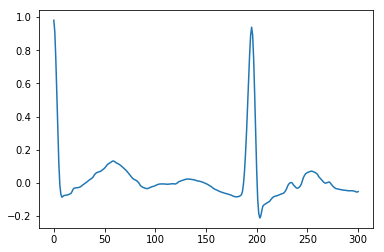

A01711
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


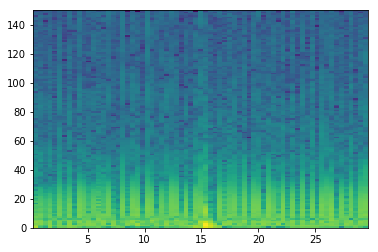

good List
[2, 4, 6, 8, 12, 14, 15, 16, 17, 30, 32, 37, 44, 47, 52, 54, 56, 58, 64]
[2, 2, 2, 4, 2, 1, 1, 1, 13, 2, 5, 7, 3, 5, 2, 2, 2, 6]
the temp 3
[[], [], [], [], [], [6, 7, 8], [], [], [], [], [], [], [], [], []]
[14, 15, 16, 17]
longest
[14, 15, 16, 17]
indexList
[14, 15, 16, 17]
theMin
1800
theMax
2100


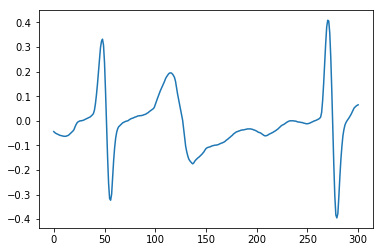

A01715
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64      ]


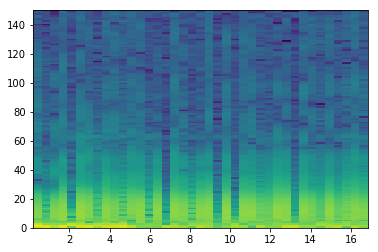

good List
[0, 1, 2, 4, 9, 15, 18, 21, 23, 26, 27, 30, 33, 35]
[1, 1, 2, 5, 6, 3, 3, 2, 3, 1, 3, 3, 2]
the temp 3
[[1, 2], [], [], [], [], [], [], [10], [], []]
[0, 1, 2]
longest
[0, 1, 2]
indexList
[0, 1, 2]
theMin
0
theMax
300


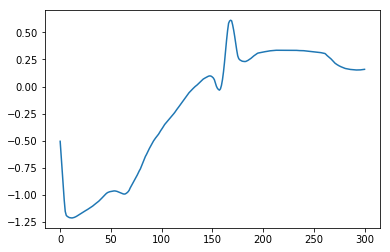

A01718
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


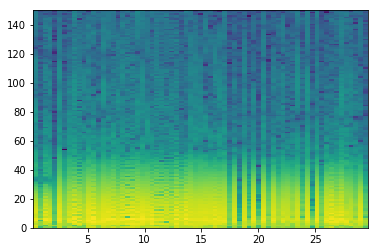

good List
[1, 4, 6, 40, 42, 44, 46, 48, 57, 59, 68]
[3, 2, 34, 2, 2, 2, 2, 9, 2, 9]
the temp 3
[[], [], [], [], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


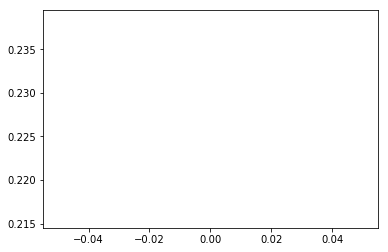

A01747
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


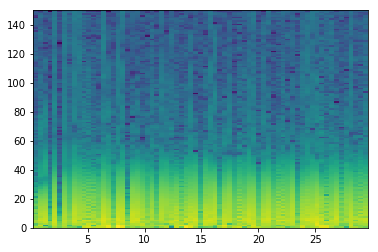

good List
[0, 3, 5, 7, 19, 20, 22, 29, 30, 31, 34, 38, 41, 43, 46, 49, 50, 54, 55, 60, 63, 68]
[3, 2, 2, 12, 1, 2, 7, 1, 1, 3, 4, 3, 2, 3, 3, 1, 4, 1, 5, 3, 5]
the temp 3
[[], [], [], [], [5], [], [8, 9], [], [], [], [], [], [16], [18], [], []]
[29, 30, 31]
longest
[29, 30, 31]
indexList
[29, 30, 31]
theMin
3600
theMax
3900


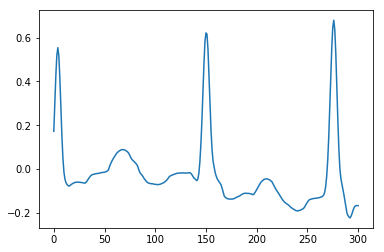

A01753
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


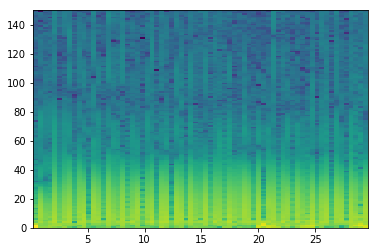

good List
[0, 2, 3, 5, 8, 10, 11, 14, 19, 22, 25, 26, 28, 31, 33, 34, 36, 41, 42, 44, 45, 47, 50, 53, 55, 57, 58, 61]
[2, 1, 2, 3, 2, 1, 3, 5, 3, 3, 1, 2, 3, 2, 1, 2, 5, 1, 2, 1, 2, 3, 3, 2, 2, 1, 3]
the temp 3
[[], [2], [], [], [6], [], [], [], [11], [], [], [15], [], [18], [20], [], [], [], [], [26]]
[2, 3]
longest
[2, 3]
indexList
[2, 3]
theMin
300
theMax
600


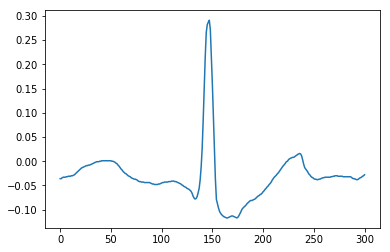

A01765
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


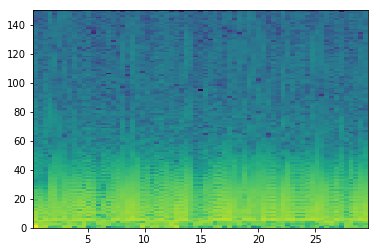

good List
[7, 33, 61]
[26, 28]
the temp 3
[[], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


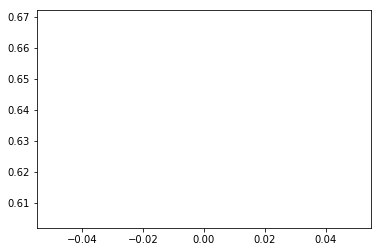

A01774
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333  32.
  32.42666667  32.85333333  33.28      

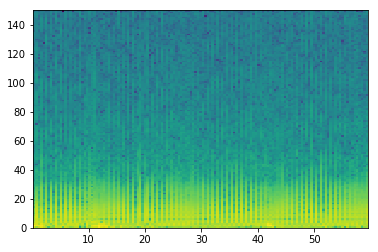

good List
[0, 2, 4, 6, 8, 10, 12, 13, 14, 16, 18, 20, 26, 28, 30, 32, 33, 34, 36, 38, 40, 42, 45, 48, 50, 52, 54, 59, 65, 67, 69, 73, 75, 77, 79, 82, 85, 87, 93, 97, 98, 100, 101, 102, 104, 105, 106, 107, 108, 110, 112, 114, 116, 117, 118, 120, 122, 124, 126, 128, 130, 131, 132, 133, 137]
[2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 6, 2, 2, 2, 1, 1, 2, 2, 2, 2, 3, 3, 2, 2, 2, 5, 6, 2, 2, 4, 2, 2, 2, 3, 3, 2, 6, 4, 1, 2, 1, 1, 2, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 4]
the temp 3
[[], [], [], [], [], [], [7, 8], [], [], [], [], [], [], [16, 17], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [40], [42, 43], [45, 46, 47, 48], [], [], [], [53, 54], [], [], [], [], [], [61, 62, 63]]
[104, 105, 106, 107, 108]
longest
[104, 105, 106, 107, 108]
indexList
[104, 105, 106, 107, 108]
theMin
13200
theMax
13800


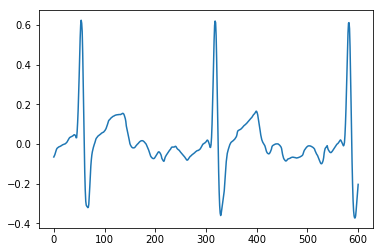

A01776
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


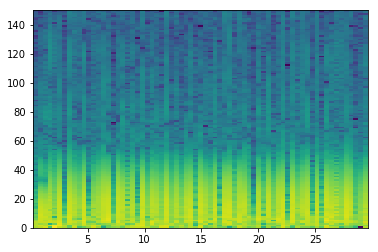

good List
[0, 6, 11, 16, 23, 30, 45, 57]
[6, 5, 5, 7, 7, 15, 12]
the temp 3
[[], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


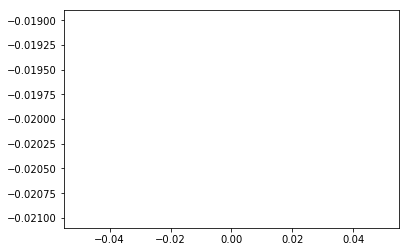

A01784
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


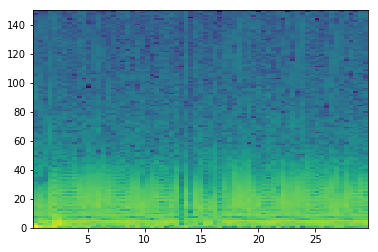

good List
[32]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


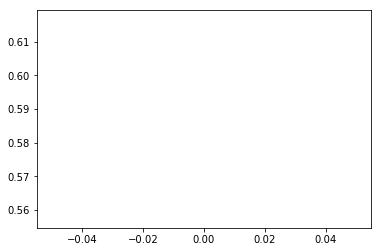

A01786
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667]


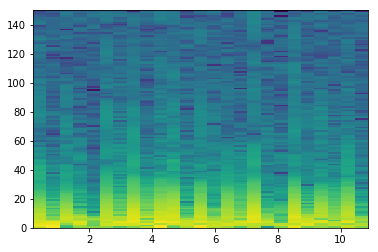

good List
[0, 1, 2, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 15, 17, 18, 19, 20, 21, 22, 24]
[1, 1, 1, 1, 1, 1, 2, 1, 2, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1, 2]
the temp 3
[[1, 2, 3, 4, 5, 6], [8], [10, 11, 12, 13], [15, 16, 17, 18, 19]]
[0, 1, 2, 3, 4, 5, 6]
longest
[0, 1, 2, 3, 4, 5, 6]
indexList
[0, 1, 2, 3, 4, 5, 6]
theMin
0
theMax
600


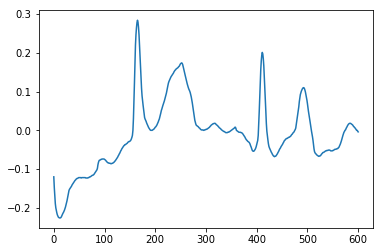

A01811
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


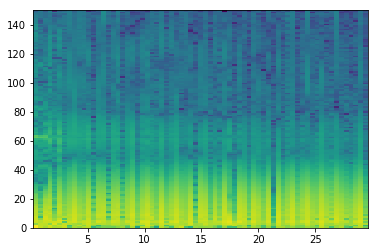

good List
[44, 49, 51, 54, 65, 68]
[5, 2, 3, 11, 3]
the temp 3
[[], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


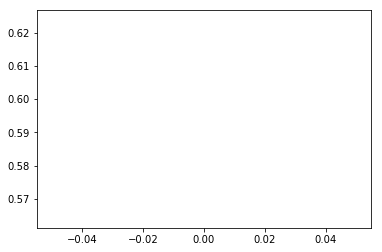

A01828
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


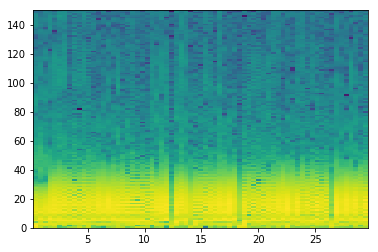

good List
[28, 32, 42, 61]
[4, 10, 19]
the temp 3
[[], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


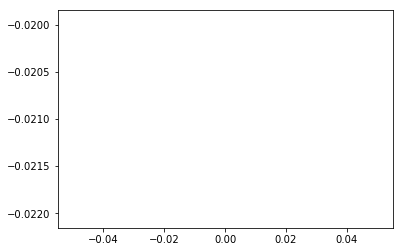

A01831
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


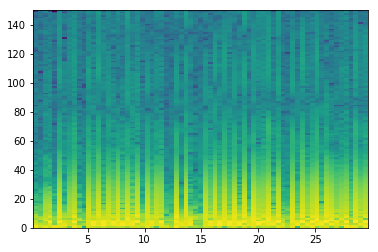

good List
[0, 1, 2, 3, 4, 6, 7, 9, 10, 14, 22, 24, 27, 28, 30, 33, 34, 40, 42, 44, 49, 51, 52, 56, 62, 65]
[1, 1, 1, 1, 2, 1, 2, 1, 4, 8, 2, 3, 1, 2, 3, 1, 6, 2, 2, 5, 2, 1, 4, 6, 3]
the temp 3
[[1, 2, 3, 4], [6], [8], [], [], [], [13], [], [16], [], [], [], [], [22], [], []]
[0, 1, 2, 3, 4]
longest
[0, 1, 2, 3, 4]
indexList
[0, 1, 2, 3, 4]
theMin
0
theMax
600


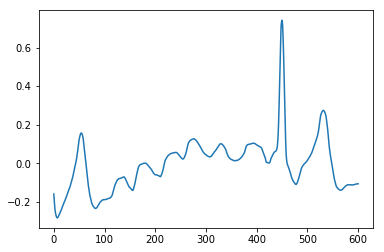

A01844
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


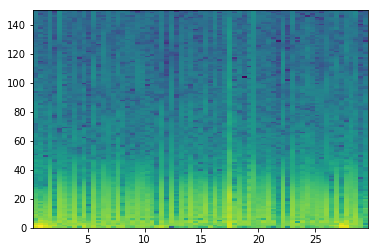

good List
[11, 13, 19, 21, 27, 50, 52]
[2, 6, 2, 6, 23, 2]
the temp 3
[[], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


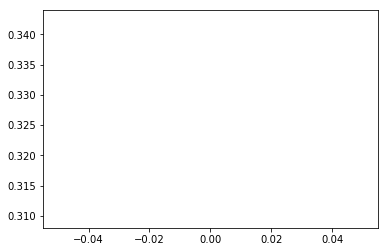

A01853
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


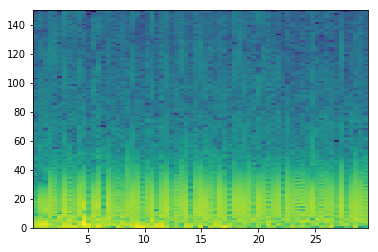

good List
[62]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


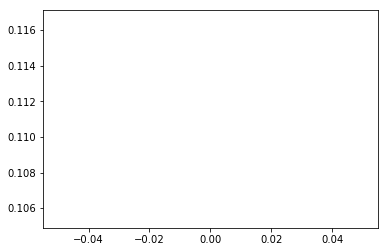

A01869
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


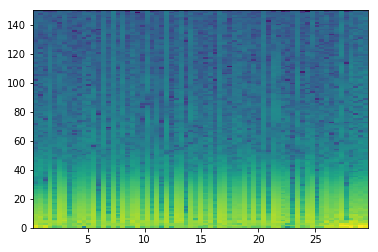

good List
[8, 13, 15, 22, 24, 26, 28, 31, 34, 37, 39, 40, 48, 52, 53, 58, 61]
[5, 2, 7, 2, 2, 2, 3, 3, 3, 2, 1, 8, 4, 1, 5, 3]
the temp 3
[[], [], [], [], [], [], [], [], [], [], [11], [], [14], []]
[39, 40]
longest
[39, 40]
indexList
[39, 40]
theMin
5100
theMax
5400


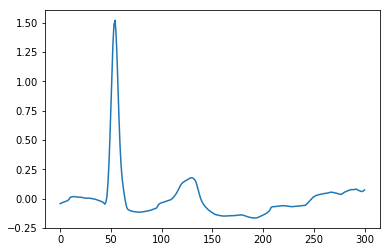

A01883
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


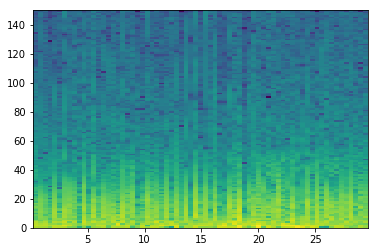

good List
[32, 39]
[7]
the temp 3
[[]]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


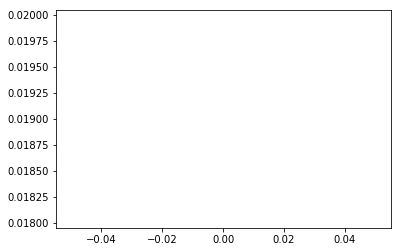

A01892
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


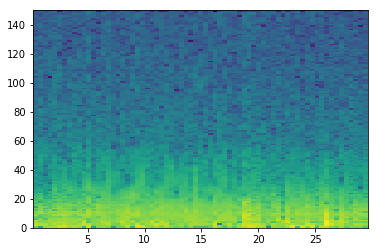

good List
[17]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


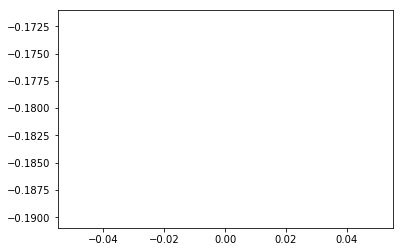

A01930
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


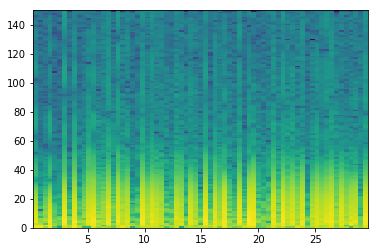

good List
[1, 2, 4, 5, 7, 9, 10, 14, 16, 20, 21, 23, 27, 28, 31, 32, 33, 34, 36, 40, 41, 43, 46, 47, 48, 56, 57, 59, 62, 67]
[1, 2, 1, 2, 2, 1, 4, 2, 4, 1, 2, 4, 1, 3, 1, 1, 1, 2, 4, 1, 2, 3, 1, 1, 8, 1, 2, 3, 5]
the temp 3
[[1], [3], [], [6], [], [], [10], [], [13], [15, 16, 17], [], [20], [], [23, 24], [26], [], []]
[31, 32, 33, 34]
longest
[31, 32, 33, 34]
indexList
[31, 32, 33, 34]
theMin
3900
theMax
4200


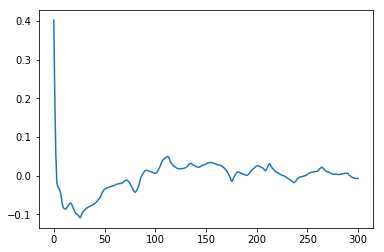

A01932
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24      ]


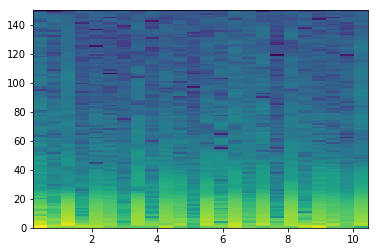

good List
[3, 6, 8, 11, 17, 21, 22]
[3, 2, 3, 6, 4, 1]
the temp 3
[[], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


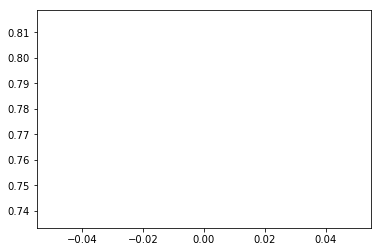

A01941
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


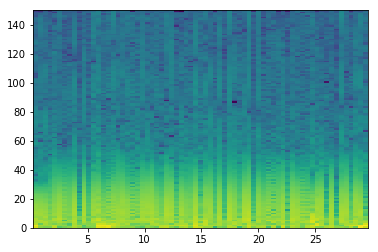

good List
[9, 11, 39, 45, 62]
[2, 28, 6, 17]
the temp 3
[[], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


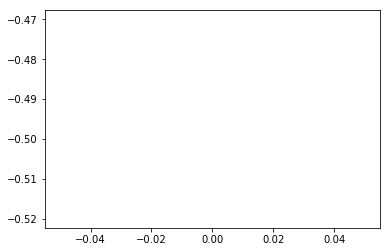

A01951
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333]


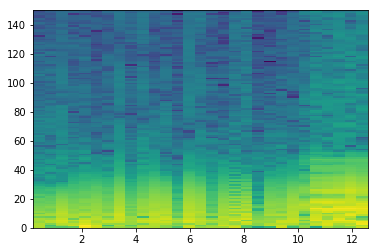

good List
[5, 12, 16]
[7, 4]
the temp 3
[[], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


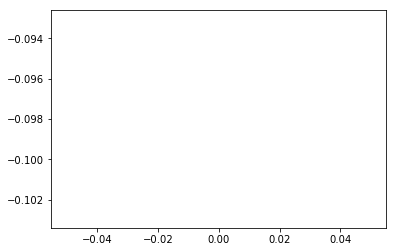

A01981
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


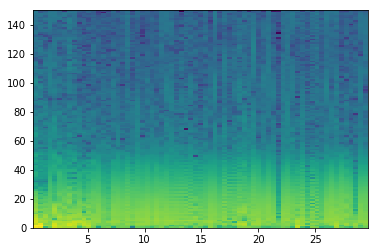

good List
[50, 66]
[16]
the temp 3
[[]]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


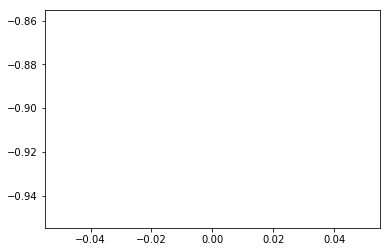

A01986
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72      ]


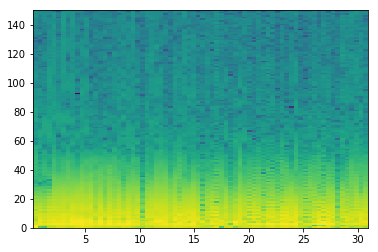

good List
[9, 14, 23, 29, 35, 38, 41, 42, 46, 55, 57, 59, 65]
[5, 9, 6, 6, 3, 3, 1, 4, 9, 2, 2, 6]
the temp 3
[[], [], [], [], [], [], [7], [], [], [], []]
[41, 42]
longest
[41, 42]
indexList
[41, 42]
theMin
5100
theMax
5400


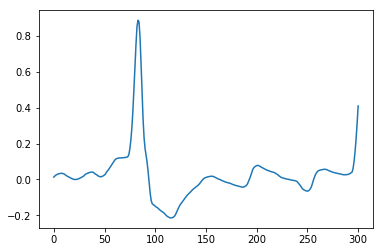

A01991
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44        29.86666667
  30.29333333  30.72        31.14666667  31.57333333]


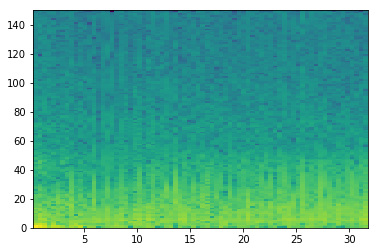

good List
[14]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


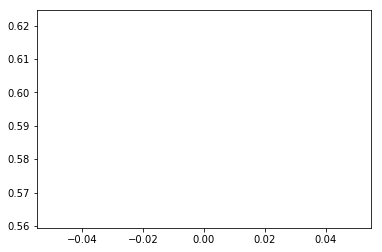

A02042
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


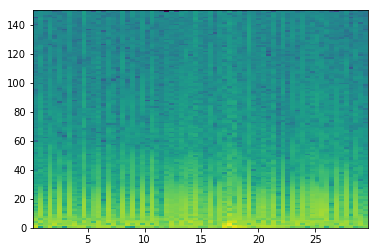

good List
[0, 2, 4, 6, 8, 9, 11, 12, 14, 17, 19, 21, 23, 26, 27, 29, 35, 37, 43, 45, 46, 48, 50, 51, 52, 61, 65, 68]
[2, 2, 2, 2, 1, 2, 1, 2, 3, 2, 2, 2, 3, 1, 2, 6, 2, 6, 2, 1, 2, 2, 1, 1, 9, 4, 3]
the temp 3
[[], [], [], [], [5], [7], [], [], [], [], [], [14], [], [], [], [], [20], [], [23, 24], [], []]
[50, 51, 52]
longest
[50, 51, 52]
indexList
[50, 51, 52]
theMin
6300
theMax
6600


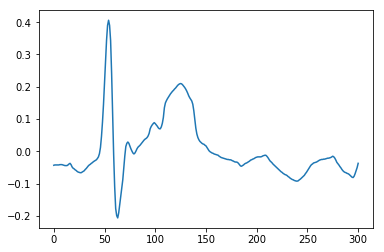

A02047
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


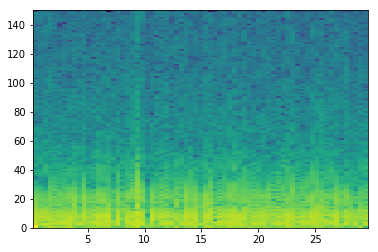

good List
[]
[]
the temp 3
[]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


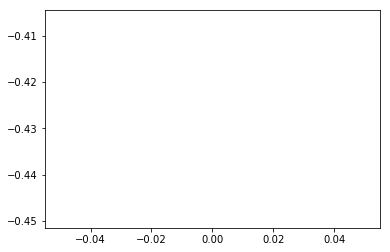

A02051
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


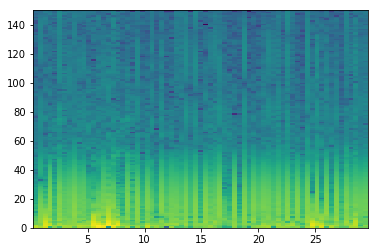

good List
[0, 25, 27, 34, 42, 44, 55, 63]
[25, 2, 7, 8, 2, 11, 8]
the temp 3
[[], [], [], [], [], [], []]
[]
longest
[]
indexList
[]
theMin
0
theMax
0


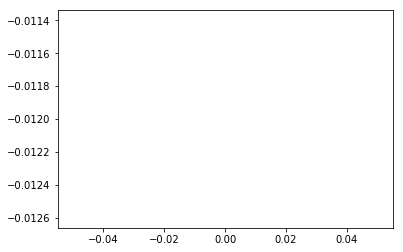

A02057
[  0.42666667   0.85333333   1.28         1.70666667   2.13333333
   2.56         2.98666667   3.41333333   3.84         4.26666667
   4.69333333   5.12         5.54666667   5.97333333   6.4
   6.82666667   7.25333333   7.68         8.10666667   8.53333333
   8.96         9.38666667   9.81333333  10.24        10.66666667
  11.09333333  11.52        11.94666667  12.37333333  12.8
  13.22666667  13.65333333  14.08        14.50666667  14.93333333
  15.36        15.78666667  16.21333333  16.64        17.06666667
  17.49333333  17.92        18.34666667  18.77333333  19.2
  19.62666667  20.05333333  20.48        20.90666667  21.33333333
  21.76        22.18666667  22.61333333  23.04        23.46666667
  23.89333333  24.32        24.74666667  25.17333333  25.6
  26.02666667  26.45333333  26.88        27.30666667  27.73333333
  28.16        28.58666667  29.01333333  29.44      ]


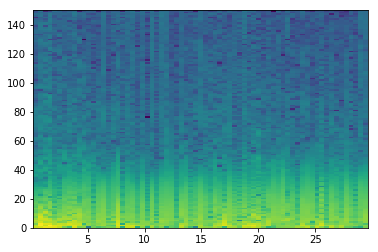

good List
[15, 23, 25, 26, 32, 53, 54, 60]
[8, 2, 1, 6, 21, 1, 6]
the temp 3
[[], [], [3], [], [6]]
[25, 26]
longest
[25, 26]
indexList
[25, 26]
theMin
3300
theMax
3600


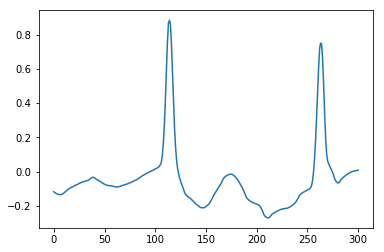

In [7]:
theCSV = open("200_set_of_Norm_AF_Rand.csv")
lineSkip = 0
for line in theCSV:
            #remove whitespace
    line = line.strip()
            #split up based off commas
    a,b,c,d = line.split(",")
            #if not at first line
    if(lineSkip != 0):
                #create plot diagram with ID at that line
        theStart(c)
    lineSkip += 1
#theStart("A00033")